In [1]:
#import required libraries
#pandas to make and manipulate dataframes
#numpy for the technical analysis
import pandas as pd
import yfinance as yf
import numpy as np
import math
#import pandas_ta as ta
import hvplot.pandas
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

#DAILY CHART ANALYSIS

In [2]:
# parameter setup (default values in the original indicator)
#These are the constants to be used for the moving averages, the bollinger bands and the keltner channels
#ultimately these will be needed for the squeeze and other calculations
length = 20
mult = 2
length_KC = 21
mult_KC = 2

In [3]:
#With this code you can input any stock and the data for the stock will be pulled from the Yahoo Finance API using yf.Ticker
#The data is pulled for 3 years with a daily timeframe and put into a dataframe called df_stock
value = input("Enter Stock Symbol:")
period = input('enter period of data eg 1y or 2y:')
stock = yf.Ticker(value)
print(stock.info)
stock_df = stock.history(period=period, interval='1d')
stock_df.index.duplicated().sum()
df_stock = stock_df.loc[~stock_df.index.duplicated(keep='first')]
df_stock

Enter Stock Symbol: adbe
enter period of data eg 1y or 2y: 10y


{'zip': '95110-2704', 'sector': 'Technology', 'fullTimeEmployees': 22516, 'longBusinessSummary': "Adobe Inc. operates as a diversified software company worldwide. Its Digital Media segment provides tools and solutions that enable individuals, teams, and enterprises to create, publish, promote, and monetize their digital content. Its flagship product is Creative Cloud, a subscription service that allows customer to download and access the latest versions of its creative products. This segment serves content creators, experience designers, app developers, enthusiasts, students, social media users, and creative professionals; and marketing departments and agencies, companies, and publishers. The company's Digital Experience segment offers products, services, and solutions for creating, managing, executing, measuring, monetizing, and optimizing customer experiences from analytics to commerce. This segment serves marketers, advertisers, agencies, publishers, merchandisers, merchants, web an

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2011-10-24,27.309999,28.230000,27.240000,28.200001,6770700,0,0
2011-10-25,28.049999,28.280001,27.770000,27.850000,6455700,0,0
2011-10-26,28.090000,28.150000,27.250000,27.809999,6735200,0,0
2011-10-27,28.510000,28.680000,28.139999,28.340000,7891500,0,0
2011-10-28,28.150000,29.059999,28.080000,29.020000,4545700,0,0
...,...,...,...,...,...,...,...
2021-10-18,610.650024,623.469971,607.570007,622.830017,1905100,0,0
2021-10-19,625.260010,639.390015,625.260010,636.070007,2470000,0,0
2021-10-20,639.280029,641.289978,630.169983,632.369995,1497200,0,0


In [4]:
# calculate Bollinger Bands which are the measure of the standard deviation.  These bands are set at the 2 times standard deviation
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg = df_stock['Close'].ewm(span=length).mean()
df_stock['Moving average'] = m_avg
# standard deviation
m_std = df_stock['Close'].rolling(window=length).std()
# upper Bollinger Bands
df_stock['upper_BB'] = m_avg + mult * m_std
# lower Bollinger Bands 
df_stock['lower_BB'] = m_avg - mult * m_std

In [5]:
#Stacked Moving averages, exponentially weighted.  Focusing on Fibonacci numbers here with 8, 21, 34, 55 and 89 day moving averages
m_avg_08 = df_stock['Close'].ewm(span=8).mean()
m_avg_21 = df_stock['Close'].ewm(span=21).mean()
m_avg_34 = df_stock['Close'].ewm(span=34).mean()
m_avg_55 = df_stock['Close'].ewm(span=55).mean()
m_avg_89 = df_stock['Close'].ewm(span=89).mean()

df_stock['m_avg_08'] = m_avg_08
df_stock['m_avg_21'] = m_avg_21
df_stock['m_avg_34'] = m_avg_34
df_stock['m_avg_55'] = m_avg_55
df_stock['m_avg_89'] = m_avg_89

In [6]:
# calculate Keltner Channel which is a measure of the average true range.  In this case the channels are set to twice the average true range
# first we need to calculate True Range
df_stock['tr0'] = abs(df_stock["High"] - df_stock["Low"])
df_stock['tr1'] = abs(df_stock["High"] - df_stock["Close"].shift())
df_stock['tr2'] = abs(df_stock["Low"] - df_stock["Close"].shift())
df_stock['tr'] = df_stock[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR or average true range
range_ma = df_stock['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock['upper_KC'] = m_avg + range_ma * mult_KC
# lower Keltner Channel
df_stock['lower_KC'] = m_avg - range_ma * mult_KC

In [7]:
#ADX Calculations
# Average directional index which shows the trend of the stock.  Above 20 means trending and below means sideways movement

plus_dm = df_stock["High"].diff()
minus_dm = df_stock["Low"].diff()
plus_dm[plus_dm < 0] = 0
minus_dm[minus_dm > 0] = 0

#plus_di and minus di show the direction of the trend, if plus_di > minus_di the trend is positive
#if minus_di > plus_di the trend is negative
df_stock['atr'] = df_stock['tr'].ewm(span=14).mean()
df_stock['plus_di'] = 100 * (plus_dm.ewm(alpha = 1/14).mean() / df_stock['atr'])
df_stock['minus_di'] = abs(100 * (minus_dm.ewm(alpha = 1/14).mean() / df_stock['atr']))
dx = (abs(df_stock['plus_di'] - df_stock['minus_di']) / abs(df_stock['plus_di'] + df_stock['minus_di'])) * 100
adx = ((dx.shift(1) * (14 - 1)) + dx) / 14
df_stock['adx'] = adx.ewm(alpha = 1/14).mean() #ADX>20 is trending ADX<20 not trending

In [8]:
# check for 'squeeze' see if the squeeze is on or off.
df_stock['squeeze_on'] = (df_stock['lower_BB'] > df_stock['lower_KC']) & (df_stock['upper_BB'] < df_stock['upper_KC'])
df_stock['squeeze_off'] = (df_stock['lower_BB'] < df_stock['lower_KC']) & (df_stock['upper_BB'] > df_stock['upper_KC'])

In [9]:
# Momentum
# This is the code to eventually make the histograms momentum indicator in the squeeze.  This is where the df['value'] number comes in.

highest = df_stock['High'].rolling(window = length_KC).max()
lowest = df_stock['Low'].rolling(window = length_KC).min()
m1 = (highest + lowest) / 2
df_stock['value'] = (df_stock['Close'] - (m1 + m_avg)/2)
fit_y = np.array(range(0,length_KC))
df_stock['value'] = df_stock['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y, x, 1)[1], raw=True)

df_stock[['squeeze_on', 'squeeze_off']] = (df_stock[['squeeze_on', 'squeeze_off']] == True).astype(float)

df_stock["pct_change"] = df_stock['Close'].pct_change()*100

"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions =  [
    (df_stock['pct_change'] > 0),
    (df_stock['pct_change'] < 0)
]

label = [1, 0]
df_stock['profitable?'] = np.select(conditions, label) 
df_stock.dropna(inplace=True)
df_stock.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-18,610.650024,623.469971,607.570007,622.830017,1905100,0,0,600.744097,651.181826,550.306368,599.077625,601.421545,608.380730,609.765233,599.458679,15.899963,13.379944,2.520020,15.899963,627.497702,573.990492,13.209624,29.721004,26.171310,36.567940,0.0,1.0,-13.945886,2.088215,1
2021-10-19,625.260010,639.390015,625.260010,636.070007,2470000,0,0,604.108470,652.562167,555.654773,607.298154,604.571405,609.962975,610.704689,600.272264,14.130005,16.559998,2.429993,16.559998,631.440837,576.776102,13.656340,35.022179,23.506984,34.477560,0.0,1.0,-2.243058,2.125779,1
2021-10-20,639.280029,641.289978,630.169983,632.369995,1497200,0,0,606.800044,656.222064,557.378023,612.869675,607.098550,611.243376,611.478450,600.985547,11.119995,5.219971,5.900024,11.119995,633.669468,579.930619,13.318161,34.365366,22.382175,33.427542,0.0,1.0,8.876988,-0.581699,0
2021-10-21,632.000000,639.169983,629.000000,638.659973,1586600,0,0,609.834323,660.602372,559.066273,618.600852,609.967770,612.810039,612.449219,601.822756,10.169983,6.799988,3.369995,10.169983,636.110160,583.558485,12.898404,32.949177,22.107722,32.540922,0.0,1.0,19.016895,0.994667,1
2021-10-22,640.429993,644.429993,634.450012,643.580017,1786500,0,0,613.048198,667.056544,559.039852,624.151778,613.023429,614.568323,613.561033,602.750695,9.979980,5.770020,4.209961,9.979980,638.749865,587.346532,12.509281,34.550886,21.167177,31.645184,0.0,1.0,29.412320,0.770370,1


In [10]:
# entry point for long position:
# 1. black cross becomes gray (the squeeze is released)
long_cond1 = (df_stock['squeeze_off'][-2] == 0) | (df_stock['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2 = df_stock['value'][-1] > 0

enter_long = long_cond1 and long_cond2
# entry point for short position:
# 1. black cross becomes gray (the squeeze is released)
short_cond1 = (df_stock['squeeze_off'][-2] == 0) | (df_stock['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2 = df_stock['value'][-1] < 0
enter_short = short_cond1 and short_cond2

In [11]:
#import mplfinance to make the candlestick charts.  So far I have found this to be the best package for display purposes.
import mplfinance as mpf
%matplotlib widget
# Creating dataframe to graph in candle stick mode
ohcl = df_stock[['Open', 'High', 'Close', 'Low']]
ohcl.head()

,Open,High,Close,Low
Date,,,,
2011-12-20,27.950001,28.490000,28.440001,27.860001
2011-12-21,28.290001,28.379999,27.969999,27.400000
2011-12-22,28.049999,28.250000,27.889999,27.700001
2011-12-23,28.040001,28.299999,28.290001,27.950001
2011-12-27,28.250000,28.760000,28.500000,28.160000


In [12]:
# add colors for the 'value bar'.  See the comment below for what the colors mean.
colors = []
for ind, val in enumerate(df_stock['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock['value'][ind-1]:
      color='red'
  colors.append(color)

In [13]:
#This column of colors is added to the dataframe because it will be used as part of our algorithmic trade entry signals
#Red histogram is mark down, Blue is distribution, Yellow is accumulation, and Cyan is mark up
#Generally we want to enter on a squeeze where there is a yellow or cyan histogram
df_stock['colors'] = colors
df_stock['ADX_trend'] = 20

In [14]:
# Adding all the plots including ADX, Stacked moving averages and Squeeze,2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock['Moving average'], color = 'black'),
        mpf.make_addplot(df_stock['m_avg_08'], color = 'yellow'),
        mpf.make_addplot(df_stock[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock[['ADX_trend']], panel=2, color = 'red', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# Plot ohcl with subplots
#Panel 1 is the squeeze
#Panel 2 is the ADX
#Panel 3 is the stacked moving average momentum indicators
fig, axes = mpf.plot(df_stock, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              ylabel='Price ($)',       
              addplot=apds,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [15]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    
    Slow stochastics is an oscillating momentum indicator
    It goes up with the stock and down as well
    Right now 70 is considered overbought and 30 is oversold
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs = stochastics( df_stock, 'Low', 'High', 'Close', 14, 3 )
slow_k = stochs['k_slow'].values
fast_k = stochs['k_fast'].values
df_stock["slow_K"] = slow_k
df_stock['fast_K'] = fast_k
df_stock.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-18,610.650024,623.469971,607.570007,622.830017,1905100,0,0,600.744097,651.181826,550.306368,599.077625,601.421545,608.380730,609.765233,599.458679,15.899963,13.379944,2.520020,15.899963,627.497702,573.990492,13.209624,29.721004,26.171310,36.567940,0.0,1.0,-13.945886,2.088215,1,yellow,20,93.775952,99.102826
2021-10-19,625.260010,639.390015,625.260010,636.070007,2470000,0,0,604.108470,652.562167,555.654773,607.298154,604.571405,609.962975,610.704689,600.272264,14.130005,16.559998,2.429993,16.559998,631.440837,576.776102,13.656340,35.022179,23.506984,34.477560,0.0,1.0,-2.243058,2.125779,1,yellow,20,97.234764,96.194834
2021-10-20,639.280029,641.289978,630.169983,632.369995,1497200,0,0,606.800044,656.222064,557.378023,612.869675,607.098550,611.243376,611.478450,600.985547,11.119995,5.219971,5.900024,11.119995,633.669468,579.930619,13.318161,34.365366,22.382175,33.427542,0.0,1.0,8.876988,-0.581699,0,cyan,20,95.097356,89.994407
2021-10-21,632.000000,639.169983,629.000000,638.659973,1586600,0,0,609.834323,660.602372,559.066273,618.600852,609.967770,612.810039,612.449219,601.822756,10.169983,6.799988,3.369995,10.169983,636.110160,583.558485,12.898404,32.949177,22.107722,32.540922,0.0,1.0,19.016895,0.994667,1,cyan,20,94.413050,97.049909
2021-10-22,640.429993,644.429993,634.450012,643.580017,1786500,0,0,613.048198,667.056544,559.039852,624.151778,613.023429,614.568323,613.561033,602.750695,9.979980,5.770020,4.209961,9.979980,638.749865,587.346532,12.509281,34.550886,21.167177,31.645184,0.0,1.0,29.412320,0.770370,1,cyan,20,95.348975,99.002610


In [16]:
import pandas as pd 
import matplotlib.pyplot as plt
import requests
import numpy as np
from math import floor
from termcolor import colored as cl 

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (20, 10)

#RSI stands for Relative strength Indicator
#it is also a momentum oscillation indicator but moves a lot slower than the stochastics
#if the stock goes up the RSI should go up and vice versa
#if it doesn't this indicates a divergence, especially at the higher timeframes
#again 70 is overbought and 30 is oversold
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock['rsi_14'] = get_rsi(df_stock['Close'], 14)
df_stock = df_stock.dropna()
df_stock['Overbought'] = 70
df_stock['Oversold'] = 30
df_stock.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-18,610.650024,623.469971,607.570007,622.830017,1905100,0,0,600.744097,651.181826,550.306368,599.077625,601.421545,608.380730,609.765233,599.458679,15.899963,13.379944,2.520020,15.899963,627.497702,573.990492,13.209624,29.721004,26.171310,36.567940,0.0,1.0,-13.945886,2.088215,1,yellow,20,93.775952,99.102826,58.340669,70,30
2021-10-19,625.260010,639.390015,625.260010,636.070007,2470000,0,0,604.108470,652.562167,555.654773,607.298154,604.571405,609.962975,610.704689,600.272264,14.130005,16.559998,2.429993,16.559998,631.440837,576.776102,13.656340,35.022179,23.506984,34.477560,0.0,1.0,-2.243058,2.125779,1,yellow,20,97.234764,96.194834,62.980855,70,30
2021-10-20,639.280029,641.289978,630.169983,632.369995,1497200,0,0,606.800044,656.222064,557.378023,612.869675,607.098550,611.243376,611.478450,600.985547,11.119995,5.219971,5.900024,11.119995,633.669468,579.930619,13.318161,34.365366,22.382175,33.427542,0.0,1.0,8.876988,-0.581699,0,cyan,20,95.097356,89.994407,60.938119,70,30
2021-10-21,632.000000,639.169983,629.000000,638.659973,1586600,0,0,609.834323,660.602372,559.066273,618.600852,609.967770,612.810039,612.449219,601.822756,10.169983,6.799988,3.369995,10.169983,636.110160,583.558485,12.898404,32.949177,22.107722,32.540922,0.0,1.0,19.016895,0.994667,1,cyan,20,94.413050,97.049909,63.127574,70,30
2021-10-22,640.429993,644.429993,634.450012,643.580017,1786500,0,0,613.048198,667.056544,559.039852,624.151778,613.023429,614.568323,613.561033,602.750695,9.979980,5.770020,4.209961,9.979980,638.749865,587.346532,12.509281,34.550886,21.167177,31.645184,0.0,1.0,29.412320,0.770370,1,cyan,20,95.348975,99.002610,64.790041,70,30


In [17]:
#this plot provides the second set of studies which include the Slow Stochastic and the RSI
apds2 = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock['Moving average'], color = 'black'),
         mpf.make_addplot(df_stock['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock['slow_K'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock['fast_K'], panel=4, color = 'blue'),
         mpf.make_addplot(df_stock['Overbought'], panel=4, color = 'green'),
         mpf.make_addplot(df_stock['Oversold'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock['rsi_14'], panel=3, color='purple')]
# Plot ohcl with subplots
#Panel 1 is the squeeze
#Panel 2 is the Slow Stochastics
#Panel 3 is the RSI
fig, axes = mpf.plot(df_stock, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              volume=True,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [18]:
#This code takes a group of 2 to 3 candles and tells the trader if the swing over the next day to few days will be bullish, bearish, or no pattern
for i in range(2,df_stock.shape[0]):
    current = df_stock.iloc[i,:]
    prev = df_stock.iloc[i-1,:]
    prev_2 = df_stock.iloc[i-2,:]
    realbody = abs(current['Open'] - current['Close'])
    candle_range = current['High'] - current['Low']
    idx = df_stock.index[i]  
# Bullish swing
    df_stock.loc[idx,'Bullish swing'] = current['Low'] > prev['Low'] and prev['Low'] < prev_2['Low']
# Bearish swing
    df_stock.loc[idx,'Bearish swing'] = current['High'] < prev['High'] and prev['High'] > prev_2['High']
# Bullish pinbar
    df_stock.loc[idx,'Bullish pinbar'] = realbody <= candle_range/3 and  min(current['Open'], current['Close']) > (current['High'] + current['Low'])/2 and current['Low'] < prev['Low']
# Bearish pinbar
    df_stock.loc[idx,'Bearish pinbar'] = realbody <= candle_range/3 and max(current['Open'] , current['Close']) < (current['High'] + current['Low'])/2 and current['High'] > prev['High']
    
  # Inside bar
    df_stock.loc[idx,'Inside bar'] = current['High'] < prev['High'] and current['Low'] > prev['Low']
    
  # Outside bar
    df_stock.loc[idx,'Outside bar'] = current['High'] > prev['High'] and current['Low'] < prev['Low']
  
  # Bullish engulfing
    df_stock.loc[idx,'Bullish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] > current['Open']
# Bearish engulfing
    df_stock.loc[idx,'Bearish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] < current['Open']

df_stock.fillna(False, inplace=True)

In [19]:
columns = ['Bullish swing', 'Bearish swing', 'Bullish pinbar', 'Bearish pinbar', 'Inside bar', 'Outside bar', 'Bullish engulfing','Bearish engulfing']
#The creation of this column using this function is to use this for a graph or to get you the latest pattern

def convert(df):
    patterns = []
    for i in columns:
        if df[i]:
            patterns.append(i)
    #df['patterns'] = patterns
    if not patterns:
        patterns.append('No pattern')
    return patterns

#df_stock_dow.apply(convert, axis=1)
df_stock['pattern'] = df_stock.apply(convert, axis = 1)

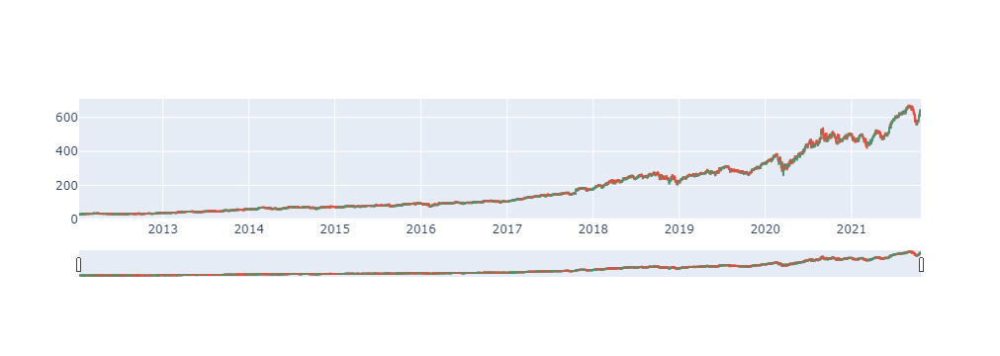

In [20]:
#This graph will give you the candlestick pattern.  When you hover over the candles, you will see the pattern at the time at which you hover the cursor
import plotly.graph_objects as go
fig = go.Figure(data=[go.Candlestick(x=df_stock.index,
                open=df_stock['Open'],
                high=df_stock['High'],
                low=df_stock['Low'],
                close=df_stock['Close'])])
fig.update_traces(text=df_stock['pattern'], selector=dict(type='candlestick'))
fig.show()

In [21]:
#Dictionary of patterns with definitions
pattern_dict = {
    'Bullish swing': 'upswing pattern',
    'Bearish swing': 'downward pattern',
    'Bullish pinbar': 'upswing hammer',
    'Bearish pinbar': 'downswing hammer',
    'Inside bar': 'trend change',
    'Outside bar': 'trend change',
    'Bullish engulfing': 'upswing from downtrend',
    'Bearish engulfing': 'downswing from uptrend',
    'No pattern': 'No pattern detected'
    }
#This will give the most current pattern from the dataframe
today = df_stock['pattern'][-1]
for i in today:
    print(f'Todays pattern is {i}, {pattern_dict[i]}')

Todays pattern is Bullish swing, upswing pattern


In [22]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker(index):
    if (df_stock['m_avg_08'][index] > df_stock['m_avg_21'][index] > df_stock['m_avg_34'][index] > df_stock['m_avg_55'][index] > df_stock['m_avg_89'][index]):
        return 'Positive momentum'
    elif (df_stock['m_avg_08'][index] < df_stock['m_avg_21'][index] < df_stock['m_avg_34'][index] < df_stock['m_avg_55'][index] < df_stock['m_avg_89'][index]):
        return 'Negative momentum'
    else:
        return 'neutral'

In [23]:
#This code throws up a flag to show if the trend of the stock is up, down, or sideways
#It uses the average directional index to determine the strength of the trend
#If ADX > 20 and the plus_di is above the minus_di the trend is positive
#If ADX > 20 and the plus_di is below the minus_di the trend is negative
#If ADX < 20 the trend is sideways

df_stock['ADX_trend'] = 20

def ADX_trend_flag(index):
    if (df_stock['adx'][index] > df_stock['ADX_trend'][index]) and (df_stock['plus_di'][index] > df_stock['minus_di'][index]):
        return 'positive trend'
    elif (df_stock['adx'][index] > df_stock['ADX_trend'][index]) and (df_stock['plus_di'][index] < df_stock['minus_di'][index]):
        return 'negative trend'
    elif (df_stock['adx'][index] < df_stock['ADX_trend'][index]):
        return 'neutral or sideways trend'

In [24]:
#This code gives an early warning if the 8 EMA crosses the 21 to the downside and amplifies the warning if it crosses the 34
#This is especially critical if it is happening to one of the market indices
def warning(index):
    if (df_stock['m_avg_08'][index] < df_stock['m_avg_21'][index]):
        return 'Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.'
    if (df_stock['m_avg_08'][index] < df_stock['m_avg_34'][index]):
        return '8 EMA has crossed 34 to the downside.  As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema'
    elif (df_stock['m_avg_08'][index] > df_stock['m_avg_21'][index]):
        return 'Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger'

In [25]:
#Warning flag to show if the squeeze is on and what market cycle the stock or index is in
def squeeze_flag(index):
    if (df_stock['squeeze_on'][index] == 1.0):
        return 'squeeze is on'
    else:
        return 'squeeze is off'
    
def squeeze_momentum(index):    
    if (df_stock['colors'][index] == 'cyan'):
        return 'stock is in a mark up mode'
    elif (df_stock['colors'][index] == 'blue'):
        return 'stock is in a distribution mode'
    elif (df_stock['colors'][index] == 'yellow'):
        return 'stock is in an accumulation mode'
    elif (df_stock['colors'][index] == 'red'):
        return 'stock is in a mark down mode'

In [26]:
squeeze_flag(-1)

'squeeze is off'

In [27]:
squeeze_momentum(-1)

'stock is in a mark up mode'

In [28]:
#Calling the warning flag functions
momentum_checker(-1)
ADX_trend_flag(-1)
warning(-1)
squeeze_momentum(-1)

'stock is in a mark up mode'

In [29]:
#Yahoo Finance download for the Fibonacci levels
df = yf.download(value,'2021-03-04', '2021-10-31')

[*********************100%***********************]  1 of 1 completed


In [30]:
#Graph for the Fibonacci Levels
fig, ax = plt.subplots()
ax.plot(df.Close, color='black')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [31]:
# Define minimum and maximum price points
price_min = df.Close.min()
price_max = df.Close.max()

In [32]:
# Fibonacci Levels using the high and the low of the time period in question
diff = price_max - price_min
level1 = price_max - 0.236 * diff
level2 = price_max - 0.382 * diff
level3 = price_max - 0.500 * diff
level4 = price_max - 0.618 * diff

In [33]:
#This adds the Fibonacci Levels to the graph above:
#Level 1 at 23.6%
#Level 2 at 38.2%
#Level 3 at 50%
#Level 4 at 61.8%
ax.axhspan(level1, price_min, alpha=0.4, color='lightsalmon')
ax.axhspan(level2, level1, alpha=0.5, color='palegoldenrod')
ax.axhspan(level3, level2, alpha=0.5, color='palegreen')
ax.axhspan(level4, level3, alpha=0.5, color='red')
ax.axhspan(price_max, level4, alpha=0.5, color='powderblue')

plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.show()

No handles with labels found to put in legend.


In [34]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
# The threshold is to set the histogram of the squeeze as close to the zero line as possible
# We want the squeeze to be on and the histogram to be close to zero and the color of the histogram to be yellow or cyan indicating accumulation
# or markup
t_percent = float(input("enter threshold percentage"))
df_stock['value_threshold'] = abs(df_stock['value'].min()* t_percent)
df_stock['squeeze_threshold'] = 1.0
df_stock["squeeze_entry"] = np.logical_and(np.greater(df_stock["value"], df_stock['value_threshold']), 
                                           np.equal(df_stock['squeeze_on'], df_stock['squeeze_threshold']))
df_stock['squeeze_entry'] = df_stock['squeeze_entry'].astype(float)
df_stock['Entry/Exit'] = df_stock['squeeze_entry'].diff()
df_stock_clean = df_stock.dropna()


enter threshold percentage 0.05


In [83]:
#This is the algo strategy.  The entry is when the squeeze is on and the histogram is near 0 and either yellow or cyan as stated before
#Exit strategy is when the stock moves up any percent you want to input
#The form of input is 1.something
#this means for example 1.5 means 50%

percent = float(input("Enter percent return"))
def implement_bb_strategy(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal

Enter percent return 1.10


In [84]:
# calling the algo function and returning the buy price, sell price, and the squeeze signal
buy_price, sell_price, squeeze_signal = implement_bb_strategy(df_stock["Close"], df_stock['squeeze_on'], df_stock['value'], 
                                                              df_stock['upper_KC'], df_stock['value_threshold'], df_stock['colors'], percent)

In [85]:
#setting dataframes to the results of the algo function
df_stock['buy_price'] =  buy_price
df_stock['sell_price'] = sell_price
df_stock['squeeze_signal'] = squeeze_signal

In [86]:
# This is give the entry and exit signals in the form of a green triangle and red triangle respectively
# Visualize exit position relative to close price
exit = df_stock[df_stock['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock[df_stock['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [87]:
# This code tells us to enter into a position when the squeeze signal is triggered according to the algo function given above
position = []
for i in range(len(squeeze_signal)):
    if df_stock['squeeze_signal'][i] < 1:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock['Close'])):
    if df_stock['squeeze_signal'][i] == 1:
        position[i] = 1
    elif df_stock['squeeze_signal'][i] == -1:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock['Close']
squeeze_signal = pd.DataFrame(squeeze_signal).rename(columns = {0:'squeeze_signal'}).set_index(df_stock.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock.index)

frames = [close_price, squeeze_signal, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy.tail()

,Date,Close,squeeze_signal,squeeze_position
2456,2021-10-18,610.090027,0.0,0
2457,2021-10-19,622.830017,0.0,0
2458,2021-10-20,636.070007,0.0,0
2459,2021-10-21,632.369995,0.0,0
2460,2021-10-22,638.659973,0.0,0


In [88]:
#This code gives us the results of the Algo trade compounding the % return and starting with 100000 as the initial investment and telling 

stock_ret = pd.DataFrame(np.diff(df_stock['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)


Profit gained from the Squeeze strategy by investing $100k in adbe is 1444326.36
Profit percentage of the Squeeze strategy : 1444%
1444326.3574428558


In [89]:
#libraries for the volume profile graphs
import pandas as pd
import numpy as np
from scipy import stats, signal
import plotly.express as px
import plotly.graph_objects as go

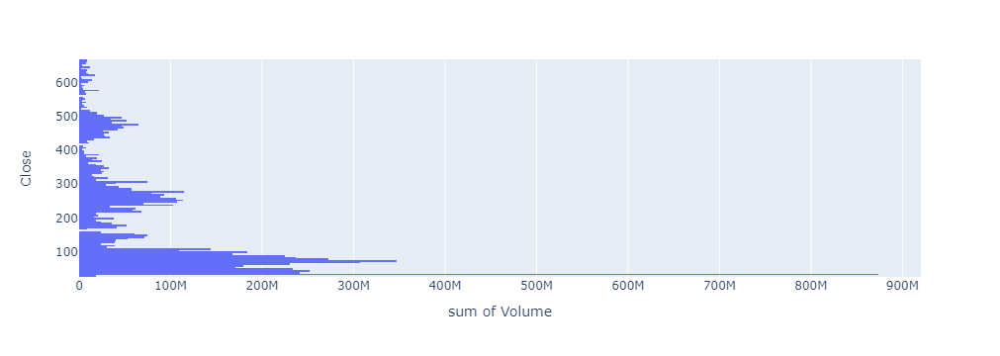

In [90]:
#This is the volume profile in which you get the volume activity at each price.  This highest volume activity at a certain price can make that price
#a good bounce off point
px.histogram(df_stock, x='Volume', y='Close', nbins=150, orientation='h').show()

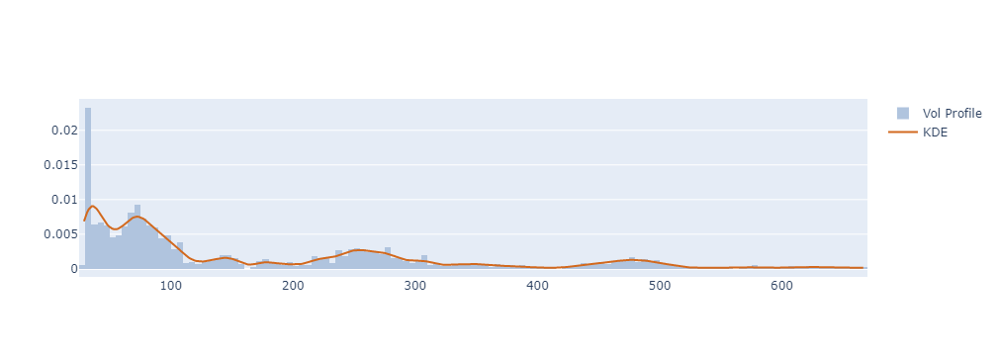

In [91]:
#This makes the volume profile graphs vertical and shows at which price the peak volumes are
kde_factor = 0.05
num_samples = 500
close = df_stock['Close']
volume = df_stock['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

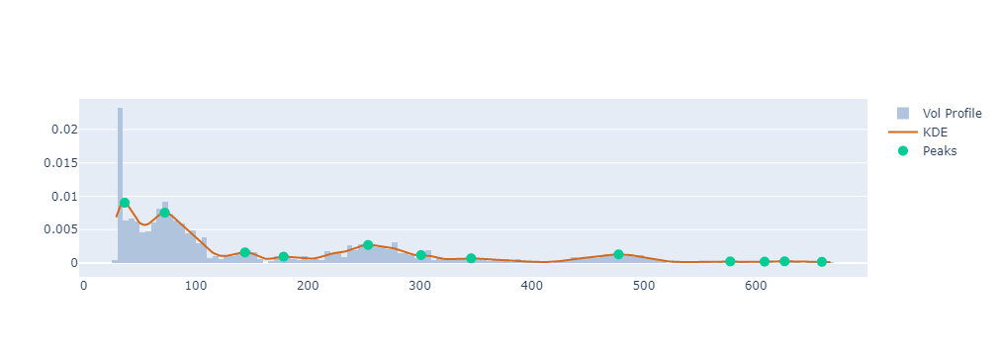

In [92]:
#This adds a green dot to show you
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

#MACHINE LEARNING

In [93]:
# Set x variable list of features
x_var_list = ['Open', 'High', 'Low', 'Close', 'Moving average', 'upper_BB', 'lower_BB', 'm_avg_08', 'pct_change', 'squeeze_on', 'upper_KC', 'lower_KC', 'squeeze_signal']

# Filter by x-variable list
df_stock[x_var_list]

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2012-01-13,29.430000,29.469999,28.830000,29.230000,28.412167,29.903990,26.920343,28.857865,-0.306958,0.0,29.755177,27.069156,0.0
2012-01-17,29.110001,29.180000,28.450001,28.969999,28.465471,29.752468,27.178474,28.882784,-0.889498,1.0,29.828294,27.102648,0.0
2012-01-18,29.170000,29.480000,28.990000,29.350000,28.549966,29.558538,27.541395,28.986610,1.311705,1.0,29.881500,27.218433,0.0
2012-01-19,29.270000,29.889999,29.219999,29.889999,28.677937,29.849766,27.506109,29.187363,1.839860,1.0,30.010243,27.345632,1.0
2012-01-20,29.910000,30.280001,29.879999,30.240000,28.827073,30.102134,27.552013,29.421282,1.170961,1.0,30.110828,27.543318,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-18,611.690002,612.250000,607.549988,610.090027,598.419264,651.691841,545.146686,592.291227,0.424687,0.0,624.668236,572.170291,0.0
2021-10-19,610.650024,623.469971,607.570007,622.830017,600.744097,651.181826,550.306368,599.077625,2.088215,0.0,627.497702,573.990492,0.0
2021-10-20,625.260010,639.390015,625.260010,636.070007,604.108470,652.562167,555.654773,607.298154,2.125779,0.0,631.440837,576.776102,0.0


In [94]:
# Shift DataFrame values by 1
df_stock[x_var_list] = df_stock[x_var_list].shift(1)
df_stock[x_var_list].tail()

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2021-10-18,600.000000,609.440002,596.969971,607.510010,597.190762,656.518523,537.863002,587.205856,2.772705,0.0,625.116634,569.264890,0.0
2021-10-19,611.690002,612.250000,607.549988,610.090027,598.419264,651.691841,545.146686,592.291227,0.424687,0.0,624.668236,572.170291,0.0
2021-10-20,610.650024,623.469971,607.570007,622.830017,600.744097,651.181826,550.306368,599.077625,2.088215,0.0,627.497702,573.990492,0.0
2021-10-21,625.260010,639.390015,625.260010,636.070007,604.108470,652.562167,555.654773,607.298154,2.125779,0.0,631.440837,576.776102,0.0
2021-10-22,639.280029,641.289978,630.169983,632.369995,606.800044,656.222064,557.378023,612.869675,-0.581699,0.0,633.669468,579.930619,0.0


In [95]:
# Drop NAs
df_stock = df_stock.dropna(subset=x_var_list)
df_stock = df_stock.dropna(subset=["pct_change"])

# Replace positive/negative infinity values
df_stock = df_stock.replace([np.inf, -np.inf], np.nan)

# Display sample data
df_stock.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal,Positive Return
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-17,29.430000,29.469999,28.830000,29.230000,2903500,0,0,28.412167,29.903990,26.920343,28.857865,28.524625,28.310603,28.184770,28.126718,0.490000,0.510000,0.020000,0.510000,29.755177,27.069156,0.631993,26.879179,19.561680,14.109509,0.0,0.0,1.116746,-0.306958,1,blue,20,81.862027,91.612953,63.729209,70,30,True,False,False,False,False,False,False,False,[Bullish swing],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,0.0
2012-01-18,29.110001,29.180000,28.450001,28.969999,4553700,0,0,28.465471,29.752468,27.178474,28.882784,28.649200,28.403748,28.253740,28.180070,0.670000,0.539999,0.130001,0.670000,29.828294,27.102648,0.637062,29.394748,18.000795,14.271796,1.0,0.0,1.064286,-0.889498,1,blue,20,86.381800,100.000000,70.064230,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2012-01-19,29.170000,29.480000,28.990000,29.350000,4303100,0,0,28.549966,29.558538,27.541395,28.986610,28.794295,28.511843,28.333698,28.241902,0.400002,0.390001,0.010000,0.400002,29.881500,27.218433,0.605448,33.352029,17.570519,15.015103,1.0,0.0,1.180828,1.311705,1,cyan,20,96.624595,98.260831,73.317217,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,29.889999,NaN,0.0,1.0
2012-01-20,29.270000,29.889999,29.219999,29.889999,4091200,0,0,28.677937,29.849766,27.506109,29.187363,28.949823,28.628679,28.420509,28.309158,0.369999,0.309999,0.059999,0.369999,30.010243,27.345632,0.574050,36.033281,17.192178,16.193614,1.0,1.0,1.243795,1.839860,1,cyan,20,98.756276,98.007997,75.451296,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,1.0,1.0
2012-01-23,29.910000,30.280001,29.879999,30.240000,5378200,0,0,28.827073,30.102134,27.552013,29.421282,29.066520,28.722630,28.492707,28.365939,0.800001,0.280001,0.520000,0.800001,30.110828,27.543318,0.604181,34.512996,17.545681,17.567185,1.0,1.0,1.304086,1.170961,0,cyan,20,92.065264,79.926964,69.256653,70,30,False,False,False,True,False,True,False,False,"[Bearish pinbar, Outside bar]",2.724956,1.0,0.0,0.0,NaN,NaN,0.0,1.0


In [96]:
# Construct the dependent variable where if hourly return is greater than 0, then 1, else, 0.
df_stock["Positive Return"] = np.where(df_stock["pct_change"] > 0, 1.0, 0.0)

# Display sample data
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal,Positive Return
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-17,29.430000,29.469999,28.830000,29.230000,2903500,0,0,28.412167,29.903990,26.920343,28.857865,28.524625,28.310603,28.184770,28.126718,0.490000,0.510000,0.020000,0.510000,29.755177,27.069156,0.631993,26.879179,19.561680,14.109509,0.0,0.0,1.116746,-0.306958,1,blue,20,81.862027,91.612953,63.729209,70,30,True,False,False,False,False,False,False,False,[Bullish swing],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,0.0
2012-01-18,29.110001,29.180000,28.450001,28.969999,4553700,0,0,28.465471,29.752468,27.178474,28.882784,28.649200,28.403748,28.253740,28.180070,0.670000,0.539999,0.130001,0.670000,29.828294,27.102648,0.637062,29.394748,18.000795,14.271796,1.0,0.0,1.064286,-0.889498,1,blue,20,86.381800,100.000000,70.064230,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,0.0
2012-01-19,29.170000,29.480000,28.990000,29.350000,4303100,0,0,28.549966,29.558538,27.541395,28.986610,28.794295,28.511843,28.333698,28.241902,0.400002,0.390001,0.010000,0.400002,29.881500,27.218433,0.605448,33.352029,17.570519,15.015103,1.0,0.0,1.180828,1.311705,1,cyan,20,96.624595,98.260831,73.317217,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,29.889999,NaN,0.0,1.0
2012-01-20,29.270000,29.889999,29.219999,29.889999,4091200,0,0,28.677937,29.849766,27.506109,29.187363,28.949823,28.628679,28.420509,28.309158,0.369999,0.309999,0.059999,0.369999,30.010243,27.345632,0.574050,36.033281,17.192178,16.193614,1.0,1.0,1.243795,1.839860,1,cyan,20,98.756276,98.007997,75.451296,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,1.0,1.0
2012-01-23,29.910000,30.280001,29.879999,30.240000,5378200,0,0,28.827073,30.102134,27.552013,29.421282,29.066520,28.722630,28.492707,28.365939,0.800001,0.280001,0.520000,0.800001,30.110828,27.543318,0.604181,34.512996,17.545681,17.567185,1.0,1.0,1.304086,1.170961,0,cyan,20,92.065264,79.926964,69.256653,70,30,False,False,False,True,False,True,False,False,"[Bearish pinbar, Outside bar]",2.724956,1.0,0.0,0.0,NaN,NaN,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-18,600.000000,609.440002,596.969971,607.510010,1905100,0,0,597.190762,656.518523,537.863002,587.205856,601.421545,608.380730,609.765233,599.458679,15.899963,13.379944,2.520020,15.899963,625.116634,569.264890,13.209624,29.721004,26.171310,36.567940,0.0,1.0,-13.945886,2.772705,1,yellow,20,93.775952,99.102826,58.340669,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2021-10-19,611.690002,612.250000,607.549988,610.090027,2470000,0,0,598.419264,651.691841,545.146686,592.291227,604.571405,609.962975,610.704689,600.272264,14.130005,16.559998,2.429993,16.559998,624.668236,572.170291,13.656340,35.022179,23.506984,34.477560,0.0,1.0,-2.243058,0.424687,1,yellow,20,97.234764,96.194834,62.980855,70,30,False,False,False,False,False,False,False,False,[No pattern],2.724956,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2021-10-20,610.650024,623.469971,607.570007,622.830017,1497200,0,0,600.744097,651.181826,550.306368,599.077625,607.098550,611.243376,611.478450,600.985547,11.119995,5.219971,5.900024,11.119995,627.497702,573.990492,13.318161,34.365366,22.382175,33.427542,0.0,1.

In [97]:
# Construct training start and end dates
training_start = df_stock.index.min().strftime(format= "%Y-%m-%d")
training_end = "2019-04-14"

# Construct testing start and end dates
testing_start =  "2019-09-15"
testing_end = df_stock.index.max().strftime(format= "%Y-%m-%d")

# Print training and testing start/end dates
print(f"Training Start: {training_start}")
print(f"Training End: {training_end}")
print(f"Testing Start: {testing_start}")
print(f"Testing End: {testing_end}")

Training Start: 2012-01-17
Training End: 2019-04-14
Testing Start: 2019-09-15
Testing End: 2021-10-22


In [98]:
# Construct the X_train and y_train datasets
X_train = df_stock[x_var_list][training_start:training_end]
y_train = df_stock["Positive Return"][training_start:training_end]

# Display sample data
display(X_train.tail())
display(y_train.tail())

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2019-04-08,270.980011,271.470001,263.720001,267.890015,264.433427,274.165071,254.701784,267.766440,-1.329645,1.0,275.789525,253.077329,0.0
2019-04-09,269.440002,269.940002,266.589996,267.450012,264.720721,273.623168,255.818274,267.696123,-0.164247,1.0,275.653539,253.787904,0.0
2019-04-10,266.959991,269.089996,264.700012,268.809998,265.110176,274.084499,256.135854,267.943651,0.508501,1.0,275.847280,254.373072,0.0
2019-04-11,267.119995,269.989990,266.799988,268.989990,265.479682,274.634794,256.324571,268.176171,0.066959,1.0,275.820686,255.138678,0.0
2019-04-12,269.470001,272.160004,269.010010,271.579987,266.060664,275.673468,256.447859,268.932574,0.962860,1.0,276.037942,256.083385,0.0


Date
2019-04-08    0.0
2019-04-09    0.0
2019-04-10    1.0
2019-04-11    1.0
2019-04-12    1.0
Name: Positive Return, dtype: float64

In [99]:
# Construct the X test and y test datasets
X_test = df_stock[x_var_list][testing_start:testing_end]
y_test = df_stock["Positive Return"][testing_start:testing_end]

# Display sample data
display(X_test.tail())
display(y_test.tail())

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2021-10-18,600.000000,609.440002,596.969971,607.510010,597.190762,656.518523,537.863002,587.205856,2.772705,0.0,625.116634,569.264890,0.0
2021-10-19,611.690002,612.250000,607.549988,610.090027,598.419264,651.691841,545.146686,592.291227,0.424687,0.0,624.668236,572.170291,0.0
2021-10-20,610.650024,623.469971,607.570007,622.830017,600.744097,651.181826,550.306368,599.077625,2.088215,0.0,627.497702,573.990492,0.0
2021-10-21,625.260010,639.390015,625.260010,636.070007,604.108470,652.562167,555.654773,607.298154,2.125779,0.0,631.440837,576.776102,0.0
2021-10-22,639.280029,641.289978,630.169983,632.369995,606.800044,656.222064,557.378023,612.869675,-0.581699,0.0,633.669468,579.930619,0.0


Date
2021-10-18    1.0
2021-10-19    1.0
2021-10-20    1.0
2021-10-21    1.0
2021-10-22    0.0
Name: Positive Return, dtype: float64

In [100]:
# Import sklearn required libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
%matplotlib inline

In [101]:
# Fit a SKLearn random forest using just the training set (X_train, Y_train):
#from imblearn.ensemble import EasyEnsembleClassifier
#model = EasyEnsembleClassifier(n_estimators = 100, random_state = 1)
model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=0)
model.fit(X_train, y_train)

# Make a prediction of "y" values from the X_test dataset
predictions = model.predict(X_test)

# Assemble actual y data (Y_test) with predicted y data (from just above) into two columns in a DataFrame
results = y_test.to_frame()
results["Predicted Value"] = predictions

# Display sample data
results.tail()

,Positive Return,Predicted Value
Date,,
2021-10-18,1.0,1.0
2021-10-19,1.0,1.0
2021-10-20,1.0,1.0
2021-10-21,1.0,1.0
2021-10-22,0.0,0.0


In [102]:
# Save the pre-trained model
from joblib import dump, load
dump(model, "random_forest_model.joblib")

['random_forest_model.joblib']

In [103]:
results.head()

,Positive Return,Predicted Value
Date,,
2019-09-16,1.0,1.0
2019-09-17,1.0,1.0
2019-09-18,1.0,1.0
2019-09-19,1.0,1.0
2019-09-20,0.0,0.0


In [104]:
# Load the model and make the predictions from the X_test dataset
model = load("random_forest_model.joblib")
predictions = model.predict(X_test)

# Display sample predictions
predictions[:10]

array([1., 1., 1., 1., 0., 1., 0., 0., 0., 1.])

In [105]:
# Add predicted results to DataFrame
results["Predicted Value"] = predictions

# Display sampe data
results.head(10)

,Positive Return,Predicted Value
Date,,
2019-09-16,1.0,1.0
2019-09-17,1.0,1.0
2019-09-18,1.0,1.0
2019-09-19,1.0,1.0
2019-09-20,0.0,0.0
2019-09-23,1.0,1.0
2019-09-24,0.0,0.0
2019-09-25,0.0,0.0
2019-09-26,0.0,0.0


<AxesSubplot:xlabel='Date'>

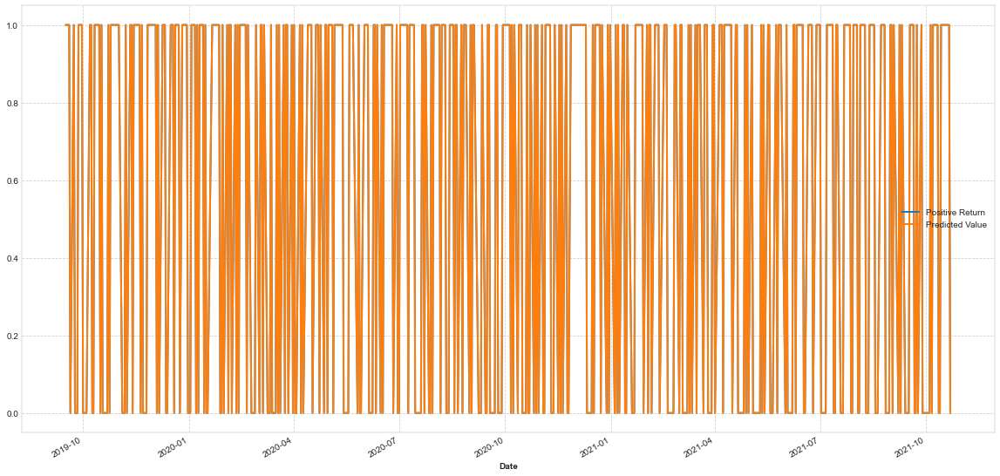

In [106]:
# Plot predicted results vs. actual results
results[["Positive Return", "Predicted Value"]].plot(figsize=(20,10))

<AxesSubplot:xlabel='Date'>

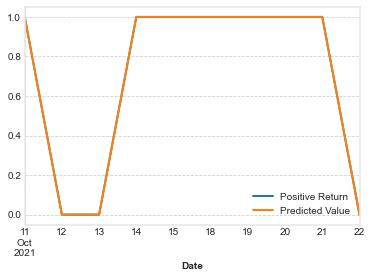

In [107]:
# Plot last 10 records of predicted vs. actual results
results[["Positive Return", "Predicted Value"]].tail(10).plot()

In [108]:
results['Return'] = df_stock['pct_change']
results

,Positive Return,Predicted Value,Return
Date,,,
2019-09-16,1.0,1.0,0.086396
2019-09-17,1.0,1.0,0.118703
2019-09-18,1.0,1.0,1.645406
2019-09-19,1.0,1.0,0.622065
2019-09-20,0.0,0.0,-1.745759
...,...,...,...
2021-10-18,1.0,1.0,2.772705
2021-10-19,1.0,1.0,0.424687
2021-10-20,1.0,1.0,2.088215


<AxesSubplot:xlabel='Date'>

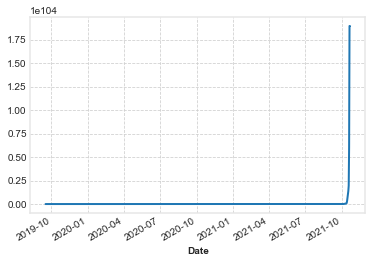

In [109]:
# Calculate cumulative return of the model
cumulative_return = (1 + (results["Return"] * results["Predicted Value"])).cumprod()

# Plotting cumulative returns
cumulative_return.plot()

<AxesSubplot:xlabel='Date'>

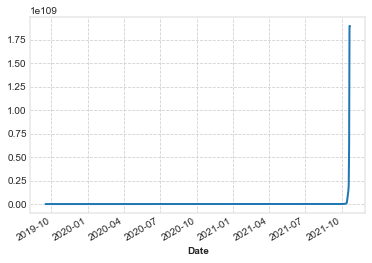

In [110]:
# Set initial capital allocation
initial_capital = 100000

# Plot cumulative return of model in terms of capital
cumulative_return_capital = initial_capital * cumulative_return
cumulative_return_capital.plot()

In [111]:
import yahoo_fin.stock_info as si

In [112]:
stock_earnings_hist = si.get_earnings_history(value)

In [113]:
import pandas as pd
 
frame = pd.DataFrame.from_dict(stock_earnings_hist)
frame.head(10)

,ticker,companyshortname,startdatetime,startdatetimetype,epsestimate,epsactual,epssurprisepct,timeZoneShortName,gmtOffsetMilliSeconds,quoteType
0,ADBE,Adobe Inc,2022-06-15T10:59:00.000Z,TNS,NaN,NaN,NaN,EDT,-14400000,EQUITY
1,ADBE,Adobe Inc,2022-03-21T10:59:00.000Z,TNS,NaN,NaN,NaN,EDT,-14400000,EQUITY
2,ADBE,Adobe Inc,2021-12-16T10:59:00.000Z,TNS,3.19,NaN,NaN,EDT,-14400000,EQUITY
3,ADBE,Adobe Inc.,2021-09-21T00:00:00.000Z,TNS,3.01,3.11,3.29,EDT,0,EQUITY
4,ADBE,Adobe Inc.,2021-06-17T00:00:00.000Z,TNS,2.81,3.03,7.75,EDT,0,EQUITY
5,ADBE,Adobe Inc.,2021-03-23T00:00:00.000Z,TNS,2.79,3.14,12.75,EDT,0,EQUITY
6,ADBE,Adobe Inc.,2020-12-10T00:00:00.000Z,TNS,2.66,2.81,5.80,EDT,0,EQUITY
7,ADBE,Adobe Inc.,2020-09-15T00:00:00.000Z,TNS,2.41,2.57,6.64,EDT,0,EQUITY
8,ADBE,Adobe Inc.,2020-06-11T00:00:00.000Z,TNS,2.33,2.45,5.15,EDT,0,EQUITY
9,ADBE,Adobe Inc.,2020-03-12T00:00:00.000Z,TNS,2.23,2.27,1.93,EDT,0,EQUITY


In [114]:
si.get_next_earnings_date(value)

datetime.datetime(2021, 12, 16, 3, 59)

In [115]:
revenue_data = si.get_earnings(value)
revenue_df = pd.Series(revenue_data).to_frame()
revenue_df

,0
quarterly_results,date actual estimate 0 4Q2020 2.81 ...
yearly_revenue_earnings,date revenue earnings 0 2017 730...
quarterly_revenue_earnings,date revenue earnings 0 4Q2020 3...


In [117]:
revenue_df.to_excel(r'Revenue.xlsx', index = False)

#Hourly Analysis

In [118]:
period_hr = input("Enter time period, eg 3mo, 6mo, etc:")
stock_df_hr = stock.history(period=period_hr, interval='1h')
stock_df_hr.index.duplicated().sum()
df_stock_hr = stock_df_hr.loc[~stock_df_hr.index.duplicated(keep='first')]
df_stock_hr.tail()

Enter time period, eg 3mo, 6mo, etc: 6mo


,Open,High,Low,Close,Volume,Dividends,Stock Splits
2021-10-22 11:30:00-04:00,638.059998,639.440002,634.450012,639.440002,178504,0,0
2021-10-22 12:30:00-04:00,639.409973,642.280029,639.260010,642.000000,138752,0,0
2021-10-22 13:30:00-04:00,641.909973,642.559998,639.979980,642.229980,115010,0,0
2021-10-22 14:30:00-04:00,642.409973,644.075012,642.292480,643.389893,189047,0,0
2021-10-22 15:30:00-04:00,643.340027,644.429993,642.849976,643.739990,279421,0,0


In [119]:
# calculate Bollinger Bands which are the measure of the standard deviation.  These bands are set at the 2 times standard deviation
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg_hr = df_stock_hr['Close'].ewm(span=length).mean()
df_stock_hr['Moving average hourly'] = m_avg_hr
# standard deviation
m_std_hr = df_stock_hr['Close'].rolling(window=length).std()
# upper Bollinger Bands
df_stock_hr['upper_BB'] = m_avg_hr + mult * m_std_hr
# lower Bollinger Bands 
df_stock_hr['lower_BB'] = m_avg_hr - mult * m_std_hr

In [120]:
#Stacked Moving averages hourly, again, Fibonacci style moving averages
m_avg_08_hr = df_stock_hr['Close'].ewm(span=8).mean()
m_avg_21_hr = df_stock_hr['Close'].ewm(span=21).mean()
m_avg_34_hr = df_stock_hr['Close'].ewm(span=34).mean()
m_avg_55_hr = df_stock_hr['Close'].ewm(span=55).mean()
m_avg_89_hr = df_stock_hr['Close'].ewm(span=89).mean()

df_stock_hr['m_avg_08'] = m_avg_08_hr
df_stock_hr['m_avg_21'] = m_avg_21_hr
df_stock_hr['m_avg_34'] = m_avg_34_hr
df_stock_hr['m_avg_55'] = m_avg_55_hr
df_stock_hr['m_avg_89'] = m_avg_89_hr

In [121]:
# calculate Keltner Channel hourly
# first we need to calculate True Range
df_stock_hr['tr0'] = abs(df_stock_hr["High"] - df_stock_hr["Low"])
df_stock_hr['tr1'] = abs(df_stock_hr["High"] - df_stock_hr["Close"].shift())
df_stock_hr['tr2'] = abs(df_stock_hr["Low"] - df_stock_hr["Close"].shift())
df_stock_hr['tr'] = df_stock_hr[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR or average true range
range_ma_hr = df_stock_hr['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock_hr['upper_KC'] = m_avg_hr + range_ma_hr * mult_KC
# lower Keltner Channel
df_stock_hr['lower_KC'] = m_avg_hr - range_ma_hr * mult_KC

In [122]:
#ADX Calculations hourly

plus_dm_hr = df_stock_hr["High"].diff()
minus_dm_hr = df_stock_hr["Low"].diff()
plus_dm_hr[plus_dm_hr < 0] = 0
minus_dm_hr[minus_dm_hr > 0] = 0

df_stock_hr['atr'] = df_stock_hr['tr'].ewm(span=14).mean()
df_stock_hr['plus_di'] = 100 * (plus_dm_hr.ewm(alpha = 1/14).mean() / df_stock_hr['atr'])
df_stock_hr['minus_di'] = abs(100 * (minus_dm_hr.ewm(alpha = 1/14).mean() / df_stock_hr['atr']))
dx_hr = (abs(df_stock_hr['plus_di'] - df_stock_hr['minus_di']) / abs(df_stock_hr['plus_di'] + df_stock_hr['minus_di'])) * 100
adx_hr = ((dx_hr.shift(1) * (14 - 1)) + dx_hr) / 14
df_stock_hr['adx'] = adx_hr.ewm(alpha = 1/14).mean()

In [123]:
# check for 'squeeze' hourly
df_stock_hr['squeeze_on'] = (df_stock_hr['lower_BB'] > df_stock_hr['lower_KC']) & (df_stock_hr['upper_BB'] < df_stock_hr['upper_KC'])
df_stock_hr['squeeze_off'] = (df_stock_hr['lower_BB'] < df_stock_hr['lower_KC']) & (df_stock_hr['upper_BB'] > df_stock_hr['upper_KC'])

In [124]:
# Momentum hourly for the squeeze indicator
highest_hr = df_stock_hr['High'].rolling(window = length_KC).max()
lowest_hr = df_stock_hr['Low'].rolling(window = length_KC).min()
m1_hr = (highest_hr + lowest_hr) / 2
df_stock_hr['value'] = (df_stock_hr['Close'] - (m1_hr + m_avg_hr)/2)
fit_y_hr = np.array(range(0,length_KC))
df_stock_hr['value'] = df_stock_hr['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_hr, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y_hr, x, 1)[1], raw=True)

df_stock_hr[['squeeze_on', 'squeeze_off']] = (df_stock_hr[['squeeze_on', 'squeeze_off']] == True).astype(int)

df_stock_hr["pct_change"] = df_stock_hr['Close'].pct_change()

"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions_hr =  [
    (df_stock_hr['pct_change'] > 0),
    (df_stock_hr['pct_change'] < 0)
]

label = [1, 0]
df_stock_hr['profitable?'] = np.select(conditions_hr, label) 
df_stock_hr.dropna(inplace=True)
df_stock_hr.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average hourly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
2021-10-22 11:30:00-04:00,638.059998,639.440002,634.450012,639.440002,178504,0,0,634.764921,640.904427,628.625414,638.438360,634.374149,628.780147,620.526227,613.110153,4.989990,1.380005,3.609985,4.989990,642.187866,627.341976,3.750402,31.430710,18.476789,53.292037,1,0,3.660801,0.002163,1
2021-10-22 12:30:00-04:00,639.409973,642.280029,639.260010,642.000000,138752,0,0,635.453976,642.156770,628.751182,639.229835,635.067409,629.535567,621.293148,613.752149,3.020020,2.840027,0.179993,3.020020,642.751202,628.156750,3.653018,35.516899,17.614401,51.378938,1,0,3.990280,0.004003,1
2021-10-22 13:30:00-04:00,641.909973,642.559998,639.979980,642.229980,115010,0,0,636.099310,643.309769,628.888851,639.896534,635.718551,630.260962,622.040892,614.384990,2.580017,0.559998,2.020020,2.580017,643.202246,628.996374,3.509951,34.893997,17.022914,50.119500,0,1,4.351785,0.000358,1
2021-10-22 14:30:00-04:00,642.409973,644.075012,642.292480,643.389893,189047,0,0,636.793651,644.617229,628.970073,640.672836,636.415946,631.011187,622.803356,615.029544,1.782532,1.845032,0.062500,1.845032,643.586326,630.000976,3.287962,37.880444,16.874213,49.018394,0,1,4.862964,0.001806,1
2021-10-22 15:30:00-04:00,643.340027,644.429993,642.849976,643.739990,279421,0,0,637.455207,645.792198,629.118216,641.354426,637.081768,631.738547,623.551093,615.667553,1.580017,1.040100,0.539917,1.580017,643.917642,630.992772,3.060236,38.620761,16.834907,48.262085,0,1,5.384835,0.000544,1


In [125]:
# entry point for long position on the hourly chart:
# 1. black cross becomes gray (the squeeze is released)
long_cond1_hr = (df_stock_hr['squeeze_off'][-2] == 0) | (df_stock_hr['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2_hr = df_stock_hr['value'][-1] > 0

enter_long_hr = long_cond1_hr and long_cond2_hr
# entry point for short position on the hourly chart:
# 1. black cross becomes gray (the squeeze is released)
short_cond1_hr = (df_stock_hr['squeeze_off'][-2] == 0) | (df_stock_hr['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2_hr = df_stock_hr['value'][-1] < 0
enter_short_hr = short_cond1_hr and short_cond2_hr

In [126]:
ohcl_hr = df_stock_hr[['Open', 'High', 'Close', 'Low']]
ohcl_hr.head()

,Open,High,Close,Low
2021-04-30 14:30:00-04:00,509.940002,510.450012,509.700012,508.179993
2021-04-30 15:30:00-04:00,509.670013,509.690002,508.609985,507.149994
2021-05-03 09:30:00-04:00,510.970001,511.739990,509.049988,505.470215
2021-05-03 10:30:00-04:00,509.440002,510.089996,504.619995,504.130005
2021-05-03 11:30:00-04:00,504.579987,506.059998,503.000000,502.739990


In [127]:
# add colors for the 'value bar'
colors = []
for ind, val in enumerate(df_stock_hr['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock_hr['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock_hr['value'][ind-1]:
      color='red'
  colors.append(color)

df_stock_hr['colors'] = colors
df_stock_hr['ADX_trend'] = 20

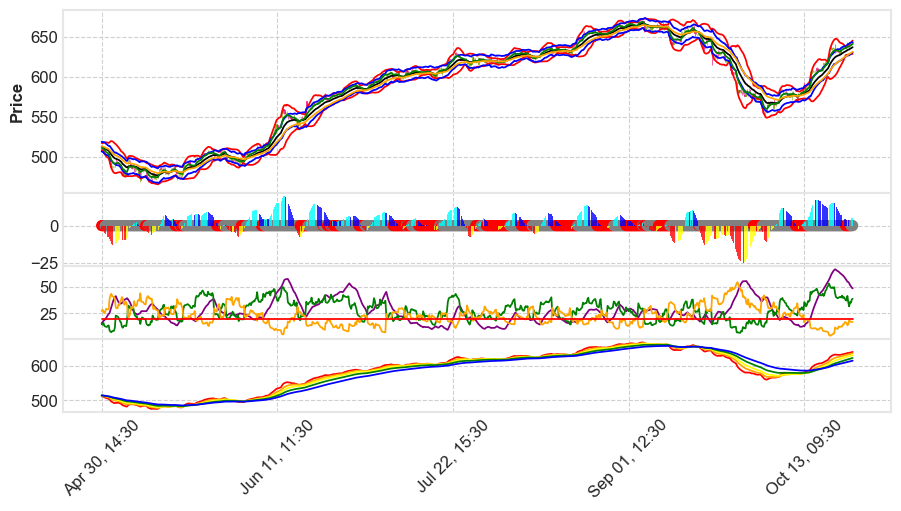

In [128]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock_hr['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock_hr), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_hr['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock_hr[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock_hr[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock_hr[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_hr[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_hr['Moving average hourly'], color = 'black'),
        mpf.make_addplot(df_stock_hr['m_avg_08'], color='green'),
        mpf.make_addplot(df_stock_hr['m_avg_34'], color='orange'),
        mpf.make_addplot(df_stock_hr[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock_hr[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock_hr[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock_hr[['ADX_trend']], panel=2, color = 'red', secondary_y=False),
        mpf.make_addplot(df_stock_hr['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock_hr['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock_hr['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock_hr['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock_hr['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
#Squeeze Panel 1
#ADX panel 2
#Momentum Panel 3
fig, axes = mpf.plot(ohcl_hr, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              returnfig=True)

In [129]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    
    Slow stochastics is an oscillating momentum indicator
    It goes up with the stock and down as well
    Right now 70 is considered overbought and 30 is oversold
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs_hr = stochastics( df_stock_hr, 'Low', 'High', 'Close', 14, 3 )
slow_k_hr = stochs_hr['k_slow'].values
fast_k_hr = stochs_hr['k_fast'].values
df_stock_hr["slow_K"] = slow_k_hr
df_stock_hr['fast_K'] = fast_k_hr
df_stock_hr.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average hourly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K
2021-10-22 11:30:00-04:00,638.059998,639.440002,634.450012,639.440002,178504,0,0,634.764921,640.904427,628.625414,638.438360,634.374149,628.780147,620.526227,613.110153,4.989990,1.380005,3.609985,4.989990,642.187866,627.341976,3.750402,31.430710,18.476789,53.292037,1,0,3.660801,0.002163,1,blue,20,75.923157,71.851214
2021-10-22 12:30:00-04:00,639.409973,642.280029,639.260010,642.000000,138752,0,0,635.453976,642.156770,628.751182,639.229835,635.067409,629.535567,621.293148,613.752149,3.020020,2.840027,0.179993,3.020020,642.751202,628.156750,3.653018,35.516899,17.614401,51.378938,1,0,3.990280,0.004003,1,cyan,20,74.558235,89.469882
2021-10-22 13:30:00-04:00,641.909973,642.559998,639.979980,642.229980,115010,0,0,636.099310,643.309769,628.888851,639.896534,635.718551,630.260962,622.040892,614.384990,2.580017,0.559998,2.020020,2.580017,643.202246,628.996374,3.509951,34.893997,17.022914,50.119500,0,1,4.351785,0.000358,1,cyan,20,84.124590,91.052676
2021-10-22 14:30:00-04:00,642.409973,644.075012,642.292480,643.389893,189047,0,0,636.793651,644.617229,628.970073,640.672836,636.415946,631.011187,622.803356,615.029544,1.782532,1.845032,0.062500,1.845032,643.586326,630.000976,3.287962,37.880444,16.874213,49.018394,0,1,4.862964,0.001806,1,cyan,20,91.992607,95.455263
2021-10-22 15:30:00-04:00,643.340027,644.429993,642.849976,643.739990,279421,0,0,637.455207,645.792198,629.118216,641.354426,637.081768,631.738547,623.551093,615.667553,1.580017,1.040100,0.539917,1.580017,643.917642,630.992772,3.060236,38.620761,16.834907,48.262085,0,1,5.384835,0.000544,1,cyan,20,94.012038,95.528174


In [130]:
import pandas as pd 
import matplotlib.pyplot as plt
import requests
import numpy as np
from math import floor
from termcolor import colored as cl 

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (20, 10)

#RSI stands for Relative strength Indicator
#it is also a momentum oscillation indicator but moves a lot slower than the stochastics
#if the stock goes up the RSI should go up and vice versa
#if it doesn't this indicates a divergence, especially at the higher timeframes
#again 70 is overbought and 30 is oversold
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock_hr['rsi_14'] = get_rsi(df_stock_hr['Close'], 14)
df_stock_hr = df_stock_hr.dropna()
df_stock_hr['Overbought'] = 70
df_stock_hr['Oversold'] = 30
df_stock_hr.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average hourly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold
2021-10-22 11:30:00-04:00,638.059998,639.440002,634.450012,639.440002,178504,0,0,634.764921,640.904427,628.625414,638.438360,634.374149,628.780147,620.526227,613.110153,4.989990,1.380005,3.609985,4.989990,642.187866,627.341976,3.750402,31.430710,18.476789,53.292037,1,0,3.660801,0.002163,1,blue,20,75.923157,71.851214,65.734562,70,30
2021-10-22 12:30:00-04:00,639.409973,642.280029,639.260010,642.000000,138752,0,0,635.453976,642.156770,628.751182,639.229835,635.067409,629.535567,621.293148,613.752149,3.020020,2.840027,0.179993,3.020020,642.751202,628.156750,3.653018,35.516899,17.614401,51.378938,1,0,3.990280,0.004003,1,cyan,20,74.558235,89.469882,69.027780,70,30
2021-10-22 13:30:00-04:00,641.909973,642.559998,639.979980,642.229980,115010,0,0,636.099310,643.309769,628.888851,639.896534,635.718551,630.260962,622.040892,614.384990,2.580017,0.559998,2.020020,2.580017,643.202246,628.996374,3.509951,34.893997,17.022914,50.119500,0,1,4.351785,0.000358,1,cyan,20,84.124590,91.052676,69.313114,70,30
2021-10-22 14:30:00-04:00,642.409973,644.075012,642.292480,643.389893,189047,0,0,636.793651,644.617229,628.970073,640.672836,636.415946,631.011187,622.803356,615.029544,1.782532,1.845032,0.062500,1.845032,643.586326,630.000976,3.287962,37.880444,16.874213,49.018394,0,1,4.862964,0.001806,1,cyan,20,91.992607,95.455263,70.775451,70,30
2021-10-22 15:30:00-04:00,643.340027,644.429993,642.849976,643.739990,279421,0,0,637.455207,645.792198,629.118216,641.354426,637.081768,631.738547,623.551093,615.667553,1.580017,1.040100,0.539917,1.580017,643.917642,630.992772,3.060236,38.620761,16.834907,48.262085,0,1,5.384835,0.000544,1,cyan,20,94.012038,95.528174,71.221226,70,30


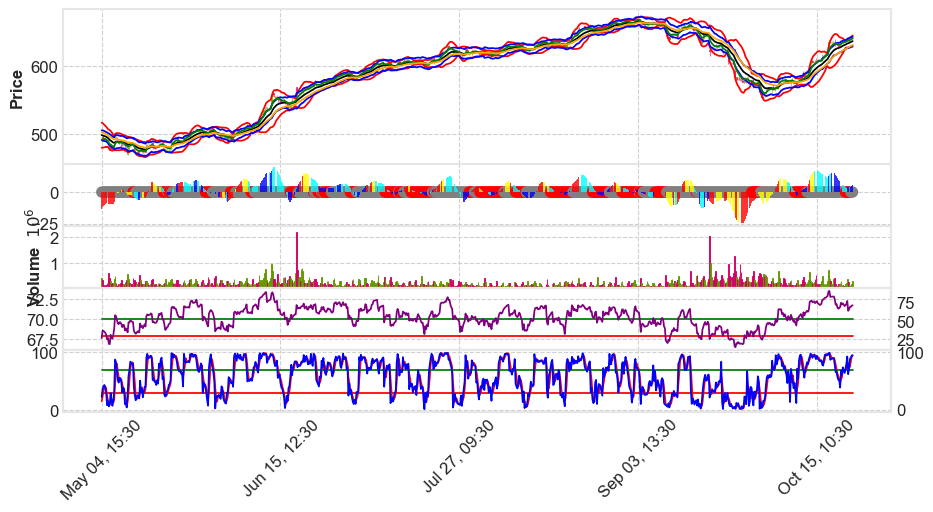

In [131]:
#this plot provides the second set of studies which include the Slow Stochastic and the RSI
apds2 = [mpf.make_addplot(df_stock_hr['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock_hr), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_hr['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock_hr[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock_hr[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock_hr[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_hr[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_hr['Moving average hourly'], color = 'black'),
         mpf.make_addplot(df_stock_hr['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock_hr['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock_hr['slow_K'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock_hr['fast_K'], panel=4, color = 'blue'),
         mpf.make_addplot(df_stock_hr['Overbought'], panel=4, color = 'green'),
         mpf.make_addplot(df_stock_hr['Oversold'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock_hr['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock_hr['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock_hr['rsi_14'], panel=3, color='purple')]
# Plot ohcl with subplots
#Panel 1 is the squeeze
#Panel 2 is the Slow Stochastics
#Panel 3 is the RSI
fig, axes = mpf.plot(df_stock_hr, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              volume=True,
              returnfig=True)

In [132]:
#This code takes a group of 2 to 3 candles and tells the trader if the swing over the next day to few days will be bullish, bearish, or no pattern
for i in range(2,df_stock_hr.shape[0]):
    current_hr = df_stock_hr.iloc[i,:]
    prev_hr = df_stock_hr.iloc[i-1,:]
    prev_2_hr = df_stock_hr.iloc[i-2,:]
    realbody_hr = abs(current_hr['Open'] - current_hr['Close'])
    candle_range_hr = current_hr['High'] - current_hr['Low']
    idx_hr = df_stock_hr.index[i]  
# Bullish swing
    df_stock_hr.loc[idx_hr,'Bullish swing'] = current_hr['Low'] > prev_hr['Low'] and prev_hr['Low'] < prev_2_hr['Low']
# Bearish swing
    df_stock_hr.loc[idx_hr,'Bearish swing'] = current_hr['High'] < prev_hr['High'] and prev_hr['High'] > prev_2_hr['High']
# Bullish pinbar
    df_stock_hr.loc[idx_hr,'Bullish pinbar'] = realbody_hr <= candle_range_hr/3 and  min(current_hr['Open'], current_hr['Close']) > (current_hr['High'] + current_hr['Low'])/2 and current_hr['Low'] < prev_hr['Low']
# Bearish pinbar
    df_stock_hr.loc[idx_hr,'Bearish pinbar'] = realbody_hr <= candle_range_hr/3 and max(current_hr['Open'] , current_hr['Close']) < (current_hr['High'] + current_hr['Low'])/2 and current_hr['High'] > prev_hr['High']
    
  # Inside bar
    df_stock_hr.loc[idx_hr,'Inside bar'] = current_hr['High'] < prev_hr['High'] and current_hr['Low'] > prev_hr['Low']
    
  # Outside bar
    df_stock_hr.loc[idx_hr,'Outside bar'] = current_hr['High'] > prev_hr['High'] and current_hr['Low'] < prev_hr['Low']
  
  # Bullish engulfing
    df_stock_hr.loc[idx_hr,'Bullish engulfing'] = current_hr['High'] > prev_hr['High'] and current_hr['Low'] < prev_hr['Low'] and realbody_hr >= 0.8 * candle_range_hr and current_hr['Close'] > current_hr['Open']
# Bearish engulfing
    df_stock_hr.loc[idx_hr,'Bearish engulfing'] = current_hr['High'] > prev_hr['High'] and current_hr['Low'] < prev_hr['Low'] and realbody_hr >= 0.8 * candle_range_hr and current_hr['Close'] < current_hr['Open']

df_stock_hr.fillna(False, inplace=True)

In [133]:
columns = ['Bullish swing', 'Bearish swing', 'Bullish pinbar', 'Bearish pinbar', 'Inside bar', 'Outside bar', 'Bullish engulfing','Bearish engulfing']
#The creation of this column using this function is to use this for a graph or to get you the latest pattern

def convert(df):
    patterns = []
    for i in columns:
        if df[i]:
            patterns.append(i)
    #df['patterns'] = patterns
    if not patterns:
        patterns.append('No pattern')
    return patterns

#df_stock_dow.apply(convert, axis=1)
df_stock_hr['pattern'] = df_stock_hr.apply(convert, axis = 1)

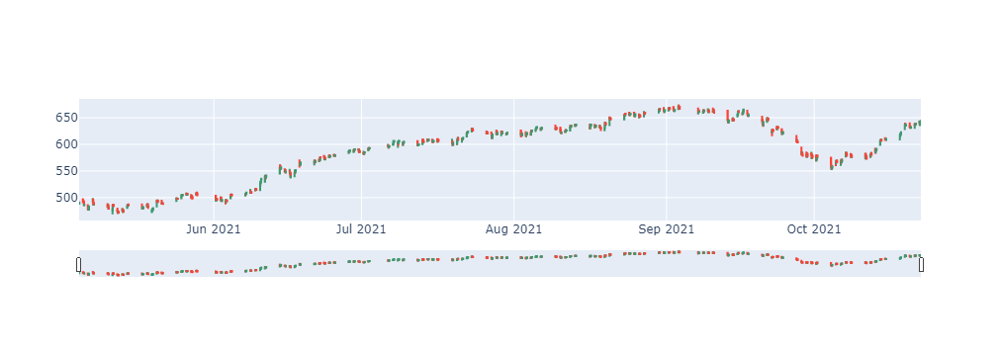

In [134]:
#This graph will give you the candlestick pattern.  When you hover over the candles, you will see the pattern at the time at which you hover the cursor
import plotly.graph_objects as go
fig = go.Figure(data=[go.Candlestick(x=df_stock_hr.index,
                open=df_stock_hr['Open'],
                high=df_stock_hr['High'],
                low=df_stock_hr['Low'],
                close=df_stock_hr['Close'])])
fig.update_traces(text=df_stock_hr['pattern'], selector=dict(type='candlestick'))
fig.show()

In [135]:
#Dictionary of patterns with definitions
pattern_dict = {
    'Bullish swing': 'upswing pattern',
    'Bearish swing': 'downward pattern',
    'Bullish pinbar': 'upswing hammer',
    'Bearish pinbar': 'downswing hammer',
    'Inside bar': 'trend change',
    'Outside bar': 'trend change',
    'Bullish engulfing': 'upswing from downtrend',
    'Bearish engulfing': 'downswing from uptrend',
    'No pattern': 'No pattern detected'
    }
#This will give the most current pattern from the dataframe
today = df_stock_hr['pattern'][-1]
for i in today:
    print(f'Todays pattern is {i}, {pattern_dict[i]}')

Todays pattern is No pattern, No pattern detected


In [136]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker_hr(index):
    if (df_stock_hr['m_avg_08'][index] > df_stock_hr['m_avg_21'][index] > df_stock_hr['m_avg_34'][index] > df_stock_hr['m_avg_55'][index] > df_stock_hr['m_avg_89'][index]):
        return 'Positive momentum'
    elif (df_stock_hr['m_avg_08'][index] < df_stock_hr['m_avg_21'][index] < df_stock_hr['m_avg_34'][index] < df_stock_hr['m_avg_55'][index] < df_stock_hr['m_avg_89'][index]):
        return 'Negative momentum'
    else:
        return 'neutral'

In [137]:
#This code throws up a flag to show if the trend of the stock is up, down, or sideways
#It uses the average directional index to determine the strength of the trend
#If ADX > 20 and the plus_di is above the minus_di the trend is positive
#If ADX > 20 and the plus_di is below the minus_di the trend is negative
#If ADX < 20 the trend is sideways

df_stock_hr['ADX_trend'] = 20

def ADX_trend_flag_hr(index):
    if (df_stock_hr['adx'][index] > df_stock_hr['ADX_trend'][index]) and (df_stock_hr['plus_di'][index] > df_stock_hr['minus_di'][index]):
        return 'positive trend'
    elif (df_stock_hr['adx'][index] > df_stock_hr['ADX_trend'][index]) and (df_stock_hr['plus_di'][index] < df_stock_hr['minus_di'][index]):
        return 'negative trend'
    elif (df_stock_hr['adx'][index] < df_stock_hr['ADX_trend'][index]):
        return 'neutral or sideways trend'

In [138]:
#This code gives an early warning if the 8 EMA crosses the 21 to the downside and amplifies the warning if it crosses the 34
#This is especially critical if it is happening to one of the market indices
def warning_hr(index):
    if (df_stock_hr['m_avg_08'][index] < df_stock_hr['m_avg_21'][index]):
        return 'Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34. Trends on the hourly may be short-lived'
    if (df_stock_hr['m_avg_08'][index] < df_stock_hr['m_avg_34'][index]):
        return '8 EMA has crossed 34 to the downside.  As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema.  Trends on the hourly may be short lived, so do not make long term decision based on it.  It can be used as a bearish entry if the daily also shows bearishness.'
    elif (df_stock_hr['m_avg_08'][index] > df_stock_hr['m_avg_21'][index]):
        return 'Continue as normal and watch for bearish candle patterns on the daily, especially when market is overbought and at the top bollinger'

In [139]:
#Warning flag to show if the squeeze is on and what market cycle the stock or index is in
def squeeze_flag_hr(index):
    if (df_stock_hr['squeeze_on'][index] == 1.0):
        return 'squeeze is on'
    else:
        return 'squeeze is off'
    
def squeeze_momentum_hr(index):    
    if (df_stock_hr['colors'][index] == 'cyan'):
        return 'stock is in a mark up mode'
    elif (df_stock_hr['colors'][index] == 'blue'):
        return 'stock is in a distribution mode'
    elif (df_stock_hr['colors'][index] == 'yellow'):
        return 'stock is in an accumulation mode'
    elif (df_stock_hr['colors'][index] == 'red'):
        return 'stock is in a mark down mode'

In [140]:
momentum_checker_hr(-1)

'Positive momentum'

In [141]:
ADX_trend_flag_hr(-1)

'positive trend'

In [142]:
warning_hr(-1)

'Continue as normal and watch for bearish candle patterns on the daily, especially when market is overbought and at the top bollinger'

In [143]:
squeeze_flag_hr(-1)

'squeeze is off'

In [144]:
squeeze_momentum_hr(-1)

'stock is in a mark up mode'

In [145]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
# The threshold is to set the histogram of the squeeze as close to the zero line as possible
# We want the squeeze to be on and the histogram to be close to zero and the color of the histogram to be yellow or cyan indicating accumulation
# or markup
t_percent_hr = float(input("enter threshold percentage"))
df_stock_hr['value_threshold'] = abs(df_stock_hr['value'].min()* t_percent_hr)
df_stock_hr['squeeze_threshold'] = 1.0
df_stock_hr["squeeze_entry"] = np.logical_and(np.greater(df_stock_hr["value"], df_stock_hr['value_threshold']), 
                                           np.equal(df_stock_hr['squeeze_on'], df_stock_hr['squeeze_threshold']))
df_stock_hr['squeeze_entry'] = df_stock_hr['squeeze_entry'].astype(float)
df_stock_hr['Entry/Exit'] = df_stock_hr['squeeze_entry'].diff()
df_stock_hr_clean = df_stock_hr.dropna()

enter threshold percentage .05


In [146]:
#This is the algo strategy.  The entry is when the squeeze is on and the histogram is near 0 and either yellow or cyan as stated before
#Exit strategy is when the stock moves up any percent you want to input
#The form of input is 1.something
#this means for example 1.5 means 50%

percent = float(input("Enter percent return"))
def implement_bb_strategy(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal

Enter percent return 1.01


In [147]:
#calling the algo function and returning the buy price, sell price, and the squeeze signal
buy_price_hr, sell_price_hr, squeeze_signal_hr = implement_bb_strategy(df_stock_hr["Close"], df_stock_hr['squeeze_on'], df_stock_hr['value'], 
                                                              df_stock_hr['upper_KC'], df_stock_hr['value_threshold'], df_stock_hr['colors'], percent)

In [148]:
#setting dataframes to the results of the algo function
df_stock_hr['buy_price'] =  buy_price_hr
df_stock_hr['sell_price'] = sell_price_hr
df_stock_hr['squeeze_signal'] = squeeze_signal_hr

In [149]:
# This is give the entry and exit signals in the form of a green triangle and red triangle respectively
# Visualize exit position relative to close price
exit = df_stock_hr[df_stock_hr['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock_hr[df_stock_hr['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock_hr[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [index]   (Close)
   .Scatter.Close.I  :Scatter   [index]   (Close)
   .Scatter.Close.II :Scatter   [index]   (Close)

In [150]:
# This code tells us to enter into a position when the squeeze signal is triggered according to the algo function given above
position = []
for i in range(len(squeeze_signal_hr)):
    if df_stock_hr['squeeze_signal'][i] < 1:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock_hr['Close'])):
    if df_stock_hr['squeeze_signal'][i] == 1:
        position[i] = 1
    elif df_stock_hr['squeeze_signal'][i] == -1:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock_hr['Close']
squeeze_signal_hr = pd.DataFrame(squeeze_signal_hr).rename(columns = {0:'squeeze_signal'}).set_index(df_stock_hr.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock_hr.index)

frames = [close_price, squeeze_signal_hr, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy.tail()

,index,Close,squeeze_signal,squeeze_position
836,2021-10-22 11:30:00-04:00,639.440002,0.0,1
837,2021-10-22 12:30:00-04:00,642.000000,0.0,1
838,2021-10-22 13:30:00-04:00,642.229980,0.0,1
839,2021-10-22 14:30:00-04:00,643.389893,0.0,1
840,2021-10-22 15:30:00-04:00,643.739990,0.0,1


In [151]:
#This code gives us the results of the Algo trade compounding the % return and starting with 100000 as the initial investment and telling 

stock_ret = pd.DataFrame(np.diff(df_stock_hr['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock_hr['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock_hr['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)

Profit gained from the Squeeze strategy by investing $100k in adbe is 12205.01
Profit percentage of the Squeeze strategy : 12%
12205.011962890625


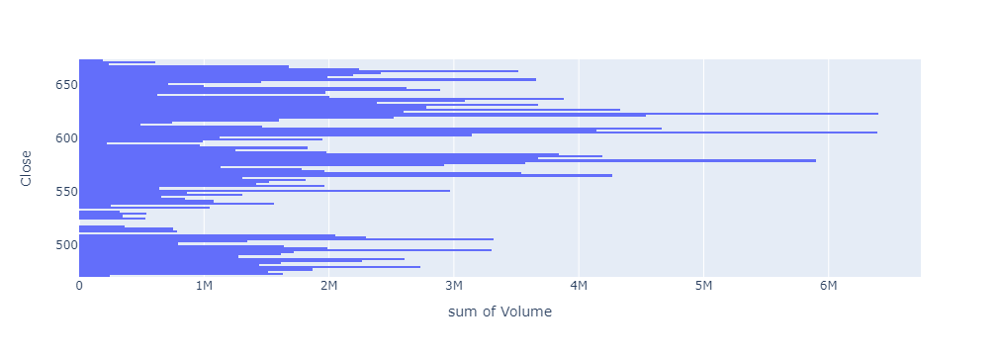

In [152]:
#This is the volume profile in which you get the volume activity at each price.  This highest volume activity at a certain price can make that price
#a good bounce off point
px.histogram(df_stock_hr, x='Volume', y='Close', nbins=150, orientation='h').show()

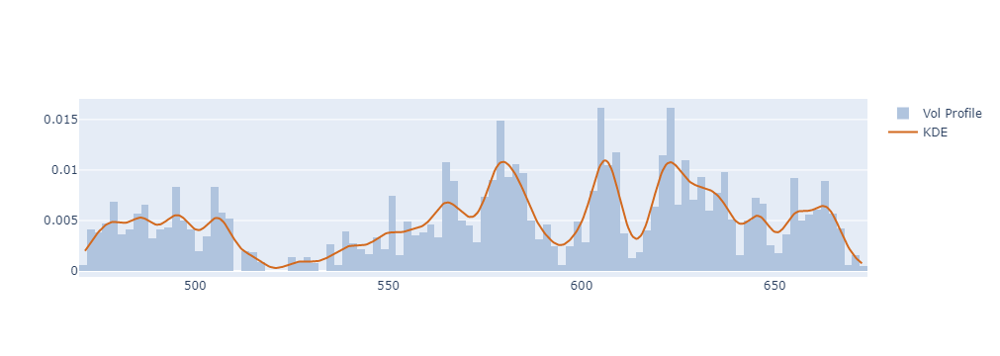

In [153]:
#This makes the volume profile graphs vertical and shows at which price the peak volumes are
kde_factor = 0.05
num_samples = 500
close = df_stock_hr['Close']
volume = df_stock_hr['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

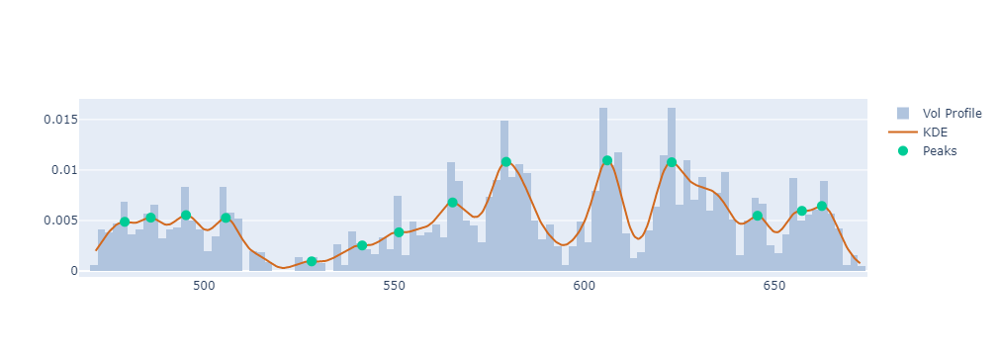

In [154]:
#This adds a green dot to show you
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

#Weekly Analysis

In [155]:
#This block of code pulls the weekly candlestick periods from Yahoo Finance and makes it into a dataframe
stock_df_wk = stock.history(period="20y", interval='1wk')
stock_df.index.duplicated().sum()
df_stock_wk = stock_df_wk.loc[~stock_df_wk.index.duplicated(keep='first')]
df_stock_wk.dropna(inplace=True)
df_stock_wk.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2021-09-27,615.799988,616.659973,568.609985,577.469971,17646800.0,0.0,0.0
2021-10-04,574.590027,586.150024,552.140015,576.859985,13057200.0,0.0,0.0
2021-10-11,574.500000,612.250000,571.500000,610.090027,9753700.0,0.0,0.0
2021-10-18,610.650024,644.429993,607.570007,643.580017,9245400.0,0.0,0.0
2021-10-22,640.429993,644.260010,634.450012,643.580017,1783347.0,0.0,0.0


In [156]:
# calculate Bollinger Bands on weekly data
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg_wk = df_stock_wk['Close'].ewm(span=length).mean()
df_stock_wk['Moving average weekly'] = m_avg_wk
# standard deviation
m_std_wk = df_stock_wk['Close'].rolling(window=length).std(ddof=0)
# upper Bollinger Bands
df_stock_wk['upper_BB'] = m_avg_wk + mult * m_std_wk
# lower Bollinger Bands 
df_stock_wk['lower_BB'] = m_avg_wk - mult * m_std_wk

In [157]:
#Stacked Moving averages weekly, again, Fibonacci style moving averages
m_avg_08_wk = df_stock_wk['Close'].ewm(span=8).mean()
m_avg_21_wk = df_stock_wk['Close'].ewm(span=21).mean()
m_avg_34_wk = df_stock_wk['Close'].ewm(span=34).mean()
m_avg_55_wk = df_stock_wk['Close'].ewm(span=55).mean()
m_avg_89_wk = df_stock_wk['Close'].ewm(span=89).mean()

df_stock_wk['m_avg_08'] = m_avg_08_wk
df_stock_wk['m_avg_21'] = m_avg_21_wk
df_stock_wk['m_avg_34'] = m_avg_34_wk
df_stock_wk['m_avg_55'] = m_avg_55_wk
df_stock_wk['m_avg_89'] = m_avg_89_wk

In [158]:
# calculate Keltner Channel weekly
# first we need to calculate True Range
df_stock_wk['tr0'] = abs(df_stock_wk["High"] - df_stock_wk["Low"])
df_stock_wk['tr1'] = abs(df_stock_wk["High"] - df_stock_wk["Close"].shift())
df_stock_wk['tr2'] = abs(df_stock_wk["Low"] - df_stock_wk["Close"].shift())
df_stock_wk['tr'] = df_stock_wk[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR or average true range
range_ma_wk = df_stock_wk['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock_wk['upper_KC'] = m_avg_wk + range_ma_wk * mult_KC
# lower Keltner Channel
df_stock_wk['lower_KC'] = m_avg_wk - range_ma_wk * mult_KC

In [159]:
#ADX Calculations weekly

plus_dm_wk = df_stock_wk["High"].diff()
minus_dm_wk = df_stock_wk["Low"].diff()
plus_dm_wk[plus_dm_wk < 0] = 0
minus_dm_wk[minus_dm_wk > 0] = 0

df_stock_wk['atr'] = df_stock_wk['tr'].ewm(span=14).mean()
df_stock_wk['plus_di'] = 100 * (plus_dm_wk.ewm(alpha = 1/14).mean() / df_stock_wk['atr'])
df_stock_wk['minus_di'] = abs(100 * (minus_dm_wk.ewm(alpha = 1/14).mean() / df_stock_wk['atr']))
dx_wk = (abs(df_stock_wk['plus_di'] - df_stock_wk['minus_di']) / abs(df_stock_wk['plus_di'] + df_stock_wk['minus_di'])) * 100
adx_wk = ((dx_wk.shift(1) * (14 - 1)) + dx_wk) / 14
df_stock_wk['adx'] = adx_wk.ewm(alpha = 1/14).mean()

In [160]:
# check for 'squeeze' weekly
df_stock_wk['squeeze_on'] = (df_stock_wk['lower_BB'] > df_stock_wk['lower_KC']) & (df_stock_wk['upper_BB'] < df_stock_wk['upper_KC'])
df_stock_wk['squeeze_off'] = (df_stock_wk['lower_BB'] < df_stock_wk['lower_KC']) & (df_stock_wk['upper_BB'] > df_stock_wk['upper_KC'])

In [161]:
# Momentum weekly for the squeeze indicator
highest_wk = df_stock_wk['High'].rolling(window = length_KC).max()
lowest_wk = df_stock_wk['Low'].rolling(window = length_KC).min()
m1_wk = (highest_wk + lowest_wk) / 2
df_stock_wk['value'] = (df_stock_wk['Close'] - (m1_wk + m_avg_wk)/2)
fit_y_wk = np.array(range(0,length_KC))
df_stock_wk['value'] = df_stock_wk['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_wk, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y_wk, x, 1)[1], raw=True)

df_stock_wk[['squeeze_on', 'squeeze_off']] = (df_stock_wk[['squeeze_on', 'squeeze_off']] == True).astype(int)

df_stock_wk["pct_change"] = df_stock_wk['Close'].pct_change()

"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions_wk =  [
    (df_stock_wk['pct_change'] > 0),
    (df_stock_wk['pct_change'] < 0)
]

label = [1, 0]
df_stock_wk['profitable?'] = np.select(conditions_wk, label) 
df_stock_wk.dropna(inplace=True)
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-07-29,12.352163,12.865177,8.342691,8.691341,85796600.0,0.0,0.0,15.189623,21.894434,8.484812,12.813163,15.287559,16.021493,16.412289,16.606730,4.522486,0.667416,3.855069,4.522486,19.670253,10.708994,2.347119,10.206349,31.732057,21.586996,0,1,-5.086607,-0.287464,0
2002-08-05,8.825820,8.990183,8.213193,8.820839,38868800.0,0.0,0.0,14.573871,21.920111,7.227632,11.925957,14.688741,15.572061,16.065987,16.323498,0.776991,0.298842,0.478149,0.776991,18.783493,10.364249,2.137253,10.367652,32.688130,23.829609,0,1,-5.666974,0.014900,1
2002-08-12,8.741148,10.185554,8.716244,10.031152,31643800.0,0.0,0.0,14.135302,21.693564,6.577040,11.504881,14.258176,15.228037,15.793393,16.097793,1.469310,1.364716,0.104595,1.469310,18.227427,10.043176,2.048004,14.373885,31.562564,25.853807,0,1,-5.867440,0.137211,1
2002-08-19,10.006249,10.519263,9.767175,10.200497,25644800.0,0.0,0.0,13.755918,21.503815,6.008020,11.215013,13.883644,14.917423,15.543128,15.889106,0.752088,0.488111,0.263976,0.752088,17.609170,9.902665,1.874896,15.857312,31.907976,26.697937,0,1,-5.928239,0.016882,1
2002-08-26,10.185556,10.584012,9.717368,10.011230,24145800.0,0.0,0.0,13.395290,21.189301,5.601279,10.947502,13.526710,14.615706,15.297808,15.683809,0.866644,0.383515,0.483128,0.866644,17.053137,9.737442,1.740248,16.091629,32.035956,27.209902,0,1,-6.022486,-0.018555,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,615.799988,616.659973,568.609985,577.469971,17646800.0,0.0,0.0,600.567950,707.320789,493.815111,625.268848,598.113446,569.471679,532.544317,484.893129,48.049988,6.050049,54.100037,54.100037,652.951805,548.184095,27.358426,26.544323,28.309473,37.846865,0,1,75.613875,-0.072650,0
2021-10-04,574.590027,586.150024,552.140015,576.859985,13057200.0,0.0,0.0,598.310048,692.847242,503.772855,614.511323,596.181313,569.893868,534.127020,486.936837,34.010010,8.680054,25.329956,34.010010,652.115373,544.504724,28.245303,23.874365,29.627001,35.411809,0,1,58.133458,-0.001056,0
2021-10-11,574.500000,612.250000,571.500000,610.090027,9753700.0,0.0,0.0,599.431951,682.256874,516.607028,613.528813,597.445742,572.190792,536.839984,489.673575,40.750000,35.390015,5.359985,40.750000,655.754973,543.108929,29.912596,27.165814,25.977368,33.606968,0,1,46.113652,0.057605,1


In [162]:
# entry point for long position on the weekly chart:
# 1. black cross becomes gray (the squeeze is released)
long_cond1_wk = (df_stock_wk['squeeze_off'][-2] == 0) | (df_stock_wk['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2_wk = df_stock_wk['value'][-1] > 0

enter_long_wk = long_cond1_wk and long_cond2_wk
# entry point for short position on the weekly chart:
# 1. black cross becomes gray (the squeeze is released)
short_cond1_wk = (df_stock_wk['squeeze_off'][-2] == 0) | (df_stock_wk['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2_wk = df_stock_wk['value'][-1] < 0
enter_short_wk = short_cond1_wk and short_cond2_wk

In [163]:
ohcl_wk = df_stock_wk[['Open', 'High', 'Close', 'Low']]
ohcl_wk.head()

,Open,High,Close,Low
Date,,,,
2002-07-29,12.352163,12.865177,8.691341,8.342691
2002-08-05,8.825820,8.990183,8.820839,8.213193
2002-08-12,8.741148,10.185554,10.031152,8.716244
2002-08-19,10.006249,10.519263,10.200497,9.767175
2002-08-26,10.185556,10.584012,10.011230,9.717368


In [164]:
# add colors for the 'value bar'
colors = []
for ind, val in enumerate(df_stock_wk['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock_wk['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock_wk['value'][ind-1]:
      color='red'
  colors.append(color)

df_stock_wk['colors'] = colors
df_stock_wk['ADX_trend']=20

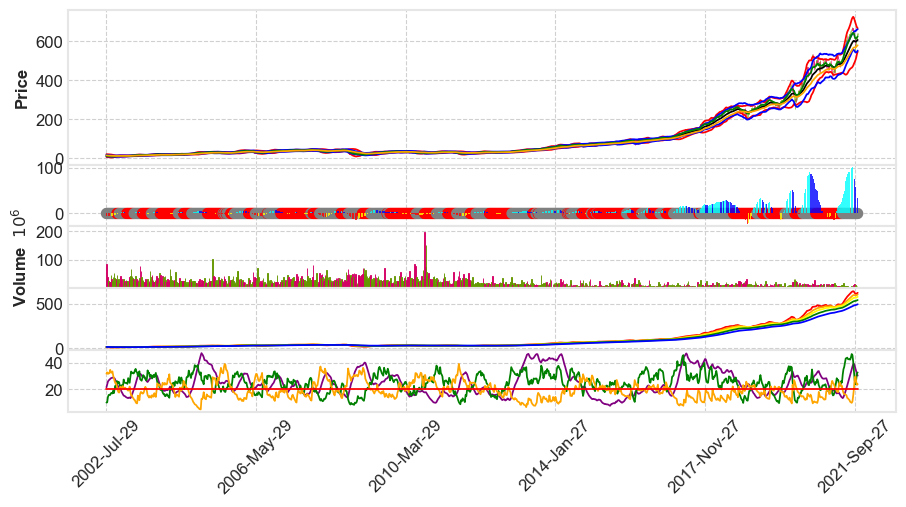

In [165]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
        mpf.make_addplot(df_stock_wk['m_avg_08'], color='green'),
        mpf.make_addplot(df_stock_wk['m_avg_34'], color='orange'),
        mpf.make_addplot(df_stock_wk[['adx']], panel=4, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock_wk[['plus_di']], panel=4, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock_wk[['minus_di']], panel=4, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock_wk[['ADX_trend']], panel=4, color = 'red', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
#Squeeze Panel 1
#ADX panel 2
#Momentum Panel 3
fig, axes = mpf.plot(df_stock_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              volume=True,
              returnfig=True)

In [166]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    
    This Stochastics is called for the weekly chart
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs_wk = stochastics( df_stock_wk, 'Low', 'High', 'Close', 14, 3 )
slow_k_wk = stochs_wk['k_slow'].values
fast_k_wk = stochs_wk['k_fast'].values
df_stock_wk["slow_K"] = slow_k_wk
df_stock_wk['fast_K'] = fast_k_wk
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-07-29,12.352163,12.865177,8.342691,8.691341,85796600.0,0.0,0.0,15.189623,21.894434,8.484812,12.813163,15.287559,16.021493,16.412289,16.606730,4.522486,0.667416,3.855069,4.522486,19.670253,10.708994,2.347119,10.206349,31.732057,21.586996,0,1,-5.086607,-0.287464,0,red,20,NaN,NaN
2002-08-05,8.825820,8.990183,8.213193,8.820839,38868800.0,0.0,0.0,14.573871,21.920111,7.227632,11.925957,14.688741,15.572061,16.065987,16.323498,0.776991,0.298842,0.478149,0.776991,18.783493,10.364249,2.137253,10.367652,32.688130,23.829609,0,1,-5.666974,0.014900,1,red,20,NaN,NaN
2002-08-12,8.741148,10.185554,8.716244,10.031152,31643800.0,0.0,0.0,14.135302,21.693564,6.577040,11.504881,14.258176,15.228037,15.793393,16.097793,1.469310,1.364716,0.104595,1.469310,18.227427,10.043176,2.048004,14.373885,31.562564,25.853807,0,1,-5.867440,0.137211,1,red,20,NaN,NaN
2002-08-19,10.006249,10.519263,9.767175,10.200497,25644800.0,0.0,0.0,13.755918,21.503815,6.008020,11.215013,13.883644,14.917423,15.543128,15.889106,0.752088,0.488111,0.263976,0.752088,17.609170,9.902665,1.874896,15.857312,31.907976,26.697937,0,1,-5.928239,0.016882,1,red,20,NaN,NaN
2002-08-26,10.185556,10.584012,9.717368,10.011230,24145800.0,0.0,0.0,13.395290,21.189301,5.601279,10.947502,13.526710,14.615706,15.297808,15.683809,0.866644,0.383515,0.483128,0.866644,17.053137,9.737442,1.740248,16.091629,32.035956,27.209902,0,1,-6.022486,-0.018555,0,red,20,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,615.799988,616.659973,568.609985,577.469971,17646800.0,0.0,0.0,600.567950,707.320789,493.815111,625.268848,598.113446,569.471679,532.544317,484.893129,48.049988,6.050049,54.100037,54.100037,652.951805,548.184095,27.358426,26.544323,28.309473,37.846865,0,1,75.613875,-0.072650,0,blue,20,49.767657,8.416437
2021-10-04,574.590027,586.150024,552.140015,576.859985,13057200.0,0.0,0.0,598.310048,692.847242,503.772855,614.511323,596.181313,569.893868,534.127020,486.936837,34.010010,8.680054,25.329956,34.010010,652.115373,544.504724,28.245303,23.874365,29.627001,35.411809,0,1,58.133458,-0.001056,0,blue,20,27.883408,20.305547
2021-10-11,574.500000,612.250000,571.500000,610.090027,9753700.0,0.0,0.0,599.431951,682.256874,516.607028,613.528813,597.445742,572.190792,536.839984,489.673575,40.750000,35.390015,5.359985,40.750000,655.754973,543.108929,29.912596,27.165814,25.977368,33.606968,0,1,46.113652,0.057605,1,blue,20,25.441148,47.601460


In [167]:
#RSI stands for Relative strength Indicator
#it is also a momentum oscillation indicator but moves a lot slower than the stochastics
#if the stock goes up the RSI should go up and vice versa
#if it doesn't this indicates a divergence, especially at the higher timeframes
#again 70 is overbought and 30 is oversold
#This is for the weekly chart

def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock_wk['rsi_14'] = get_rsi(df_stock_wk['Close'], 14)
df_stock_wk = df_stock_wk.dropna()
df_stock_wk['Overbought'] = 70
df_stock_wk['Oversold'] = 30
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-11-11,12.759071,14.508459,12.290573,14.428715,30140800.0,0.0,0.0,12.251129,15.496201,9.006057,12.222628,12.312581,13.076705,13.822426,14.356798,2.217886,1.694565,0.523321,2.217886,15.632619,8.869639,1.679932,24.582587,19.402139,22.795680,1,0,-0.521502,0.126021,1,yellow,20,87.115672,98.623253,89.622238,70,30
2002-11-18,14.254275,15.191269,13.481752,14.857340,35145800.0,0.0,0.0,12.500169,15.868208,9.132129,12.808120,12.544939,13.182140,13.864706,14.372199,1.709516,0.762554,0.946962,1.709516,15.885087,9.115251,1.683878,25.687950,17.951911,22.025977,1,0,0.492450,0.029706,1,cyan,20,90.162590,94.753327,90.341797,70,30
2002-11-25,14.857340,15.211206,14.214403,14.717789,20484000.0,0.0,0.0,12.712009,16.363492,9.060526,13.232491,12.743259,13.272882,13.899380,14.382742,0.996802,0.353866,0.642937,0.996802,15.969940,9.454078,1.592245,25.287770,17.608815,21.714891,0,1,1.413105,-0.009393,0,cyan,20,95.216082,92.271665,88.197622,70,30
2002-12-02,15.226156,15.490309,12.460030,13.003287,38794200.0,0.0,0.0,12.739826,16.450953,9.028698,13.181557,12.766983,13.256982,13.863137,14.341003,3.030279,0.772520,2.257759,3.030279,16.253464,9.226187,1.784024,22.067939,21.698799,21.350108,0,1,1.839711,-0.116492,0,cyan,20,83.234210,62.677637,67.120336,70,30
2002-12-09,13.013255,13.257471,12.380285,12.853766,44115400.0,0.0,0.0,12.750704,16.503872,8.997536,13.108714,12.774899,13.233246,13.822504,14.296362,0.877186,0.254184,0.623002,0.877186,16.103882,9.397525,1.663090,21.960128,21.939669,19.861040,0,1,2.143592,-0.011499,0,cyan,20,71.794368,60.433800,65.646935,70,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,615.799988,616.659973,568.609985,577.469971,17646800.0,0.0,0.0,600.567950,707.320789,493.815111,625.268848,598.113446,569.471679,532.544317,484.893129,48.049988,6.050049,54.100037,54.100037,652.951805,548.184095,27.358426,26.544323,28.309473,37.846865,0,1,75.613875,-0.072650,0,blue,20,49.767657,8.416437,48.301528,70,30
2021-10-04,574.590027,586.150024,552.140015,576.859985,13057200.0,0.0,0.0,598.310048,692.847242,503.772855,614.511323,596.181313,569.893868,534.127020,486.936837,34.010010,8.680054,25.329956,34.010010,652.115373,544.504724,28.245303,23.874365,29.627001,35.411809,0,1,58.133458,-0.001056,0,blue,20,27.883408,20.305547,48.151834,70,30
2021-10-11,574.500000,612.250000,571.500000,610.090027,9753700.0,0.0,0.0,599.431951,682.256874,516.607028,613.528813,597.445742,572.190792,536.839984,489.673575,40.750000,35.390015,5.359985,40.750000,655.754973,543.108929,29.912596,27.165814,25.977368,33.606968,0,1,46.113652,0.057605,1,blue,20,25.441148,47.601460,56.128535,70,30


In [168]:
%matplotlib widget
#This is the Slow stochastic and RSI graphs for the weekly charts
apds2 = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
         mpf.make_addplot(df_stock_wk['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock_wk['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock_wk['slow_K'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock_wk['fast_K'], panel=4, color = 'blue'),
         mpf.make_addplot(df_stock_wk['Overbought'], panel=4, color = 'green'),
         mpf.make_addplot(df_stock_wk['Oversold'], panel=4, color = 'red'),
         mpf.make_addplot(df_stock_wk['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock_wk['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock_wk['rsi_14'], panel=3, color='purple')]

# Plot ohcl with subplots
#Panel 1 is the squeeze
#Panel 2 is the Slow Stochastics
#Panel 3 is the RSI
fig, axes = mpf.plot(df_stock_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              volume=True,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [169]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker_wk(index):
    if (df_stock_wk['m_avg_08'][index] > df_stock_wk['m_avg_21'][index] > df_stock_wk['m_avg_34'][index] > df_stock_wk['m_avg_55'][index] > df_stock_wk['m_avg_89'][index]):
        return 'Positive momentum'
    elif (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_21'][index] < df_stock_wk['m_avg_34'][index] < df_stock_wk['m_avg_55'][index] < df_stock_wk['m_avg_89'][index]):
        return 'Negative momentum'
    else:
        return 'neutral'

#direction of trend
df_stock_wk['ADX_trend'] = 20

def ADX_trend_flag_wk(index):
    if (df_stock_wk['adx'][index] > df_stock_wk['ADX_trend'][index]) and (df_stock_wk['plus_di'][index] > df_stock_wk['minus_di'][index]):
        return 'positive trend'
    elif (df_stock_wk['adx'][index] > df_stock_wk['ADX_trend'][index]) and (df_stock_wk['plus_di'][index] < df_stock_wk['minus_di'][index]):
        return 'negative trend'
    elif (df_stock_wk['adx'][index] < df_stock_wk['ADX_trend'][index]):
        return 'neutral or sideways trend'

#early warning with the moving averages crossing
def warning_wk(index):
    if (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_21'][index]):
        return 'Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.  This is especially bad with this weekly chart'
    if (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_34'][index]):
        return 'As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema'
    elif (df_stock_wk['m_avg_08'][index] > df_stock_wk['m_avg_21'][index]):
        return 'Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger'
#squeeze cycle warning        
def squeeze_flag_wk(index):
    if (df_stock_wk['squeeze_on'][index] == 1.0):
        return 'squeeze is on'
    else:
        return'squeeze is off'

def squeeze_momentum_wk(index):
    if (df_stock_wk['colors'][index] == 'cyan'):
        return 'stock is in a mark up mode'
    elif (df_stock_wk['colors'][index] == 'blue'):
        return 'stock is in a distribution mode'
    elif (df_stock_wk['colors'][index] == 'yellow'):
        return 'stock is in an accumulation mode'
    elif (df_stock_wk['colors'][index] == 'red'):
        return 'stock is in a mark down mode'

In [170]:
momentum_checker_wk(-1)
ADX_trend_flag_wk(-1)
warning_wk(-1)
squeeze_flag_wk(-1)
squeeze_momentum_wk(-1)

'stock is in a distribution mode'

In [171]:
# To get the entry and exit signals for the algo trading using squeeze and momentum for the weekly chart
t_percent_wk = float(input("enter threshold percentage"))
df_stock_wk['value_threshold'] = abs(df_stock_wk['value'].min()*t_percent_wk)
df_stock_wk['squeeze_threshold'] = 1.0
df_stock_wk["squeeze_entry"] = np.logical_and(np.greater(df_stock_wk["value"], df_stock_wk['value_threshold']), 
                                           np.equal(df_stock_wk['squeeze_on'], df_stock_wk['squeeze_threshold']))
df_stock_wk['squeeze_entry'] = df_stock_wk['squeeze_entry'].astype(float)
df_stock_wk['Entry/Exit'] = df_stock_wk['squeeze_entry'].diff()
df_stock_wk.dropna(inplace=True)

enter threshold percentage .05


In [172]:
#this is the weekly algo trade
#just testing an idea here to be able to enter a percent profit return
#The input is entered in the form of 1.something
#For example 1.5 means a 50% return
percent = float(input('Enter Percent Return'))
def implement_bb_strategy_wk(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False
    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal

Enter Percent Return 1.15


In [173]:
#calls the strategy function
buy_price_wk, sell_price_wk, squeeze_signal_wk = implement_bb_strategy_wk(df_stock_wk["Close"], df_stock_wk['squeeze_on'], df_stock_wk['value'], 
                                                              df_stock_wk['upper_KC'], df_stock_wk['value_threshold'], df_stock_wk['colors'], percent)

In [174]:
#creates the columns and appends to the dataframe
df_stock_wk['buy_price'] =  buy_price_wk
df_stock_wk['sell_price'] = sell_price_wk
df_stock_wk['squeeze_signal'] = squeeze_signal_wk
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,ADX_trend,slow_K,fast_K,rsi_14,Overbought,Oversold,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-11-18,14.254275,15.191269,13.481752,14.857340,35145800.0,0.0,0.0,12.500169,15.868208,9.132129,12.808120,12.544939,13.182140,13.864706,14.372199,1.709516,0.762554,0.946962,1.709516,15.885087,9.115251,1.683878,25.687950,17.951911,22.025977,1,0,0.492450,0.029706,1,cyan,20,90.162590,94.753327,90.341797,70,30,1.116878,1.0,0.0,0.0,14.85734,NaN,1.0
2002-11-25,14.857340,15.211206,14.214403,14.717789,20484000.0,0.0,0.0,12.712009,16.363492,9.060526,13.232491,12.743259,13.272882,13.899380,14.382742,0.996802,0.353866,0.642937,0.996802,15.969940,9.454078,1.592245,25.287770,17.608815,21.714891,0,1,1.413105,-0.009393,0,cyan,20,95.216082,92.271665,88.197622,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
2002-12-02,15.226156,15.490309,12.460030,13.003287,38794200.0,0.0,0.0,12.739826,16.450953,9.028698,13.181557,12.766983,13.256982,13.863137,14.341003,3.030279,0.772520,2.257759,3.030279,16.253464,9.226187,1.784024,22.067939,21.698799,21.350108,0,1,1.839711,-0.116492,0,cyan,20,83.234210,62.677637,67.120336,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
2002-12-09,13.013255,13.257471,12.380285,12.853766,44115400.0,0.0,0.0,12.750704,16.503872,8.997536,13.108714,12.774899,13.233246,13.822504,14.296362,0.877186,0.254184,0.623002,0.877186,16.103882,9.397525,1.663090,21.960128,21.939669,19.861040,0,1,2.143592,-0.011499,0,cyan,20,71.794368,60.433800,65.646935,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
2002-12-16,12.833830,13.666160,12.519838,12.828846,32949200.0,0.0,0.0,12.758163,16.356071,9.160255,13.046521,12.779818,13.209481,13.782685,14.252653,1.146322,0.812394,0.333929,1.146322,16.014640,9.501685,1.594176,23.106518,21.233832,18.449215,0,1,2.411074,-0.001939,0,cyan,20,61.057087,60.059823,65.389295,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,615.799988,616.659973,568.609985,577.469971,17646800.0,0.0,0.0,600.567950,707.320789,493.815111,625.268848,598.113446,569.471679,532.544317,484.893129,48.049988,6.050049,54.100037,54.100037,652.951805,548.184095,27.358426,26.544323,28.309473,37.846865,0,1,75.613875,-0.072650,0,blue,20,49.767657,8.416437,48.301528,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
2021-10-04,574.590027,586.150024,552.140015,576.859985,13057200.0,0.0,0.0,598.310048,692.847242,503.772855,614.511323,596.181313,569.893868,534.127020,486.936837,34.010010,8.680054,25.329956,34.010010,652.115373,544.504724,28.245303,23.874365,29.627001,35.411809,0,1,58.133458,-0.001056,0,blue,20,27.883408,20.305547,48.151834,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0
2021-10-11,574.500000,612.250000,571.500000,610.090027,9753700.0,0.0,0.0,599.431951,682.256874,516.607028,613.528813,597.445742,572.190792,536.839984,489.673575,40.750000,35.390015,5.359985,40.750000,655.754973,543.108929,29.912596,27.165814,25.977368,33.606968,0,1,46.113652,0.057605,1,blue,20,25.441148,47.601460,56.128535,70,30,1.116878,1.0,0.0,0.0,NaN,NaN,0.0


In [175]:
# Visualize exit position relative to close price
exit = df_stock_wk[df_stock_wk['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock_wk[df_stock_wk['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock_wk[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [176]:
#this is the weekly backtesting for the algo code above.  See previous comments on the daily code to see how this works

position = []
#df_stock_wk = df_stock_wk.loc[~df_stock_wk.index.duplicated(keep='first')]
for i in range(len(squeeze_signal_wk)):
    if df_stock_wk['squeeze_signal'][i] < 1.0:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock_wk['Close'])):
    if df_stock_wk['squeeze_signal'][i] == 1.0:
        position[i] = 1.0
    elif df_stock_wk['squeeze_signal'][i] == -1.0:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock_wk['Close']
squeeze_signal_wk = pd.DataFrame(squeeze_signal_wk).rename(columns = {0:'squeeze_signal'}).set_index(df_stock_wk.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock_wk.index)

frames = [close_price, squeeze_signal_wk, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy

,Date,Close,squeeze_signal,squeeze_position
0,2002-11-18,14.857340,1.0,1.0
1,2002-11-25,14.717789,0.0,1.0
2,2002-12-02,13.003287,0.0,1.0
3,2002-12-09,12.853766,0.0,1.0
4,2002-12-16,12.828846,0.0,1.0
...,...,...,...,...
984,2021-09-27,577.469971,0.0,0.0
985,2021-10-04,576.859985,0.0,0.0
986,2021-10-11,610.090027,0.0,0.0
987,2021-10-18,643.580017,0.0,0.0


In [177]:
#This gives percent profit for the weekly algo code
#check the daily code for more comments

stock_ret = pd.DataFrame(np.diff(df_stock_wk['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock_wk['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock_wk['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)

Profit gained from the Squeeze strategy by investing $100k in adbe is 881226.87
Profit percentage of the Squeeze strategy : 881%
881226.8660612106


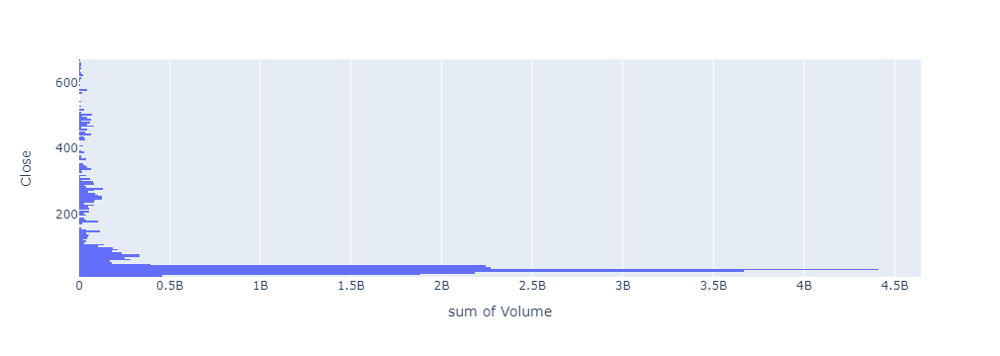

In [178]:
#This is the volume profile in which you get the volume activity at each price.  This highest volume activity at a certain price can make that price
#a good bounce off point
px.histogram(df_stock_wk, x='Volume', y='Close', nbins=150, orientation='h').show()

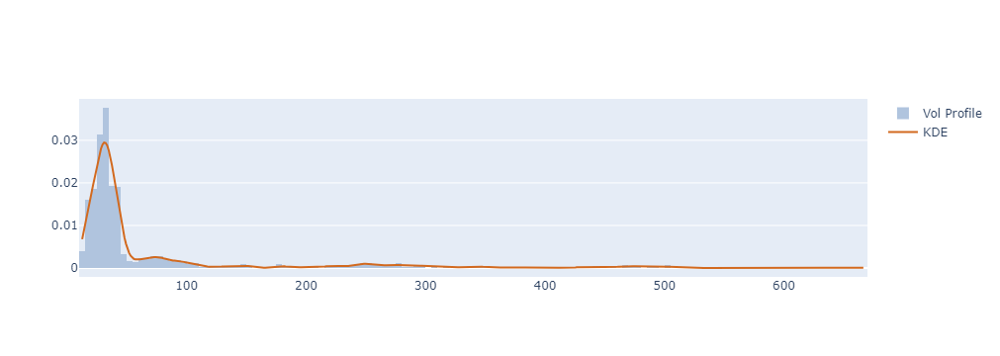

In [179]:
#makes the graph vertical like the daily charts
kde_factor = 0.05
num_samples = 500
close = df_stock_wk['Close']
volume = df_stock_wk['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

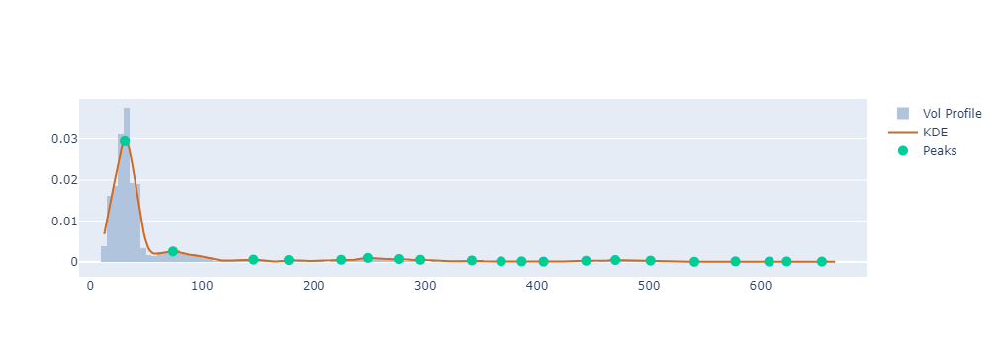

In [180]:
#adds a green dot like the daily chart
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

#Monthly Analysis

In [181]:
#This block of code pulls the monthly candlestick periods from Yahoo Finance and makes it into a dataframe
period_mo = input("Enter period eg 5y, 10y, etc:")
stock_df_mo = stock.history(period=period_mo, interval='1mo')
stock_df_mo.index.duplicated().sum()
df_stock_mo = stock_df_mo.loc[~stock_df_mo.index.duplicated(keep='first')]
df_stock_mo.dropna(inplace=True)
df_stock_mo.tail()

Enter period eg 5y, 10y, etc: 20y


,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2021-07-01,583.330017,631.640015,581.349976,621.630005,33921000.0,0.0,0.0
2021-08-01,625.869995,667.900024,612.929993,663.700012,28721200.0,0.0,0.0
2021-09-01,664.510010,673.880005,573.239990,575.719971,52671900.0,0.0,0.0
2021-10-01,577.520020,644.429993,552.140015,643.580017,34971600.0,0.0,0.0
2021-10-22,640.429993,644.260010,634.450012,643.580017,1783347.0,0.0,0.0


In [182]:
# calculate Bollinger Bands on monthly data
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg_mo = df_stock_mo['Close'].ewm(span=length).mean()
df_stock_mo['Moving average monthly'] = m_avg_mo
# standard deviation
m_std_mo = df_stock_mo['Close'].rolling(window=length).std()
# upper Bollinger Bands
df_stock_mo['upper_BB'] = m_avg_mo + mult * m_std_mo
# lower Bollinger Bands 
df_stock_mo['lower_BB'] = m_avg_mo - mult * m_std_mo
df_stock_mo.head()
df_stock_mo.dropna(inplace=True)

In [183]:
#Stacked Moving averages monthly 
m_avg_08_mo = df_stock_mo['Close'].ewm(span=8).mean()
m_avg_21_mo = df_stock_mo['Close'].ewm(span=21).mean()
m_avg_34_mo = df_stock_mo['Close'].ewm(span=34).mean()
m_avg_55_mo = df_stock_mo['Close'].ewm(span=55).mean()
m_avg_89_mo = df_stock_mo['Close'].ewm(span=89).mean()

df_stock_mo['m_avg_08'] = m_avg_08_mo
df_stock_mo['m_avg_21'] = m_avg_21_mo
df_stock_mo['m_avg_34'] = m_avg_34_mo
df_stock_mo['m_avg_55'] = m_avg_55_mo
df_stock_mo['m_avg_89'] = m_avg_89_mo

In [184]:
# calculate Keltner Channel monthly
# first we need to calculate True Range
df_stock_mo['tr0'] = abs(df_stock_mo["High"] - df_stock_mo["Low"])
df_stock_mo['tr1'] = abs(df_stock_mo["High"] - df_stock_mo["Close"].shift())
df_stock_mo['tr2'] = abs(df_stock_mo["Low"] - df_stock_mo["Close"].shift())
df_stock_mo['tr'] = df_stock_mo[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR
range_ma_mo = df_stock_mo['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock_mo['upper_KC'] = m_avg_mo + range_ma_mo * mult_KC
# lower Keltner Channel
df_stock_mo['lower_KC'] = m_avg_mo - range_ma_mo * mult_KC
df_stock_mo.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC
Date,,,,,,,,,,,,,,,,,,,,,
2021-07-01,583.330017,631.640015,581.349976,621.630005,33921000.0,0.0,0.0,458.399387,623.938290,292.860483,528.943290,453.501963,398.495169,333.818789,267.190263,50.290039,46.000000,4.290039,50.290039,573.068156,343.730618
2021-08-01,625.869995,667.900024,612.929993,663.700012,28721200.0,0.0,0.0,477.951827,658.917674,296.985980,558.889228,472.610877,413.649770,345.604358,276.066277,54.970032,46.270020,8.700012,54.970032,592.190714,363.712941
2021-09-01,664.510010,673.880005,573.239990,575.719971,52671900.0,0.0,0.0,487.263079,665.792294,308.733864,562.629393,481.984431,422.910946,353.825528,282.773039,100.640015,10.179993,90.460022,100.640015,609.414797,365.111361
2021-10-01,577.520020,644.429993,552.140015,643.580017,34971600.0,0.0,0.0,502.150406,683.674427,320.626386,580.618421,496.674939,435.520636,364.177248,290.847229,92.289978,68.710022,23.579956,92.289978,629.977419,374.323394
2021-10-22,640.429993,644.260010,634.450012,643.580017,1783347.0,0.0,0.0,515.619893,689.254582,341.985204,594.609887,510.029946,447.409768,374.159030,298.739503,9.809998,0.679993,9.130005,9.809998,633.609904,397.629883


In [185]:
#ADX Calculations monthly, same as daily and weekly

plus_dm_mo = df_stock_mo["High"].diff()
minus_dm_mo = df_stock_mo["Low"].diff()
plus_dm_mo[plus_dm_mo < 0] = 0
minus_dm_mo[minus_dm_mo > 0] = 0

df_stock_mo['atr'] = df_stock_mo['tr'].ewm(span=14).mean()
df_stock_mo['plus_di'] = 100 * (plus_dm_mo.ewm(alpha = 1/14).mean() / df_stock_mo['atr'])
df_stock_mo['minus_di'] = abs(100 * (minus_dm_mo.ewm(alpha = 1/14).mean() / df_stock_mo['atr']))
dx_mo = (abs(df_stock_mo['plus_di'] - df_stock_mo['minus_di']) / abs(df_stock_mo['plus_di'] + df_stock_mo['minus_di'])) * 100
adx_mo = ((dx_mo.shift(1) * (14 - 1)) + dx_mo) / 14
df_stock_mo['adx'] = adx_mo.ewm(alpha = 1/14).mean()
df_stock_mo.dropna(inplace=True)
df_stock_mo.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2003-09-01,19.582153,20.959490,18.080055,19.657007,177425400.0,0.0,0.0,15.983397,22.583792,9.383003,18.272712,18.007900,17.944388,17.905101,17.880772,2.879435,1.581942,1.297493,2.879435,22.792066,9.174729,3.383211,32.225329,0.000000,100.000000
2003-10-01,19.723066,22.463630,19.468479,21.844631,134537200.0,0.0,0.0,16.597180,23.706549,9.487810,19.382289,18.928009,18.818823,18.751331,18.709570,2.995151,2.806623,0.188528,2.995151,23.209591,9.984769,3.281966,36.730812,0.000000,100.000000
2003-11-01,22.074263,23.152517,19.024200,20.621614,133694000.0,0.0,0.0,17.014656,24.202746,9.826567,19.735997,19.281522,19.165152,19.092057,19.046412,4.128317,1.307886,2.820431,4.128317,23.970273,10.059040,3.477797,31.235877,2.946921,99.558702
2003-12-01,20.786345,21.465246,18.749644,19.508415,160888600.0,0.0,0.0,17.271168,24.413470,10.128866,19.674905,19.323891,19.223254,19.158218,19.116945,2.715603,0.843632,1.871971,2.715603,23.942127,10.600209,3.317186,26.231571,4.121820,94.683495
2004-01-01,19.787962,19.957688,17.861082,19.119045,159905200.0,0.0,0.0,17.459805,24.698531,10.221080,19.532280,19.288984,19.207393,19.152676,19.117228,2.096606,0.449272,1.647334,2.096606,23.708547,11.211063,3.078459,23.277414,8.751533,89.191870


In [186]:
# check for 'squeeze' monthly
df_stock_mo['squeeze_on'] = (df_stock_mo['lower_BB'] > df_stock_mo['lower_KC']) & (df_stock_mo['upper_BB'] < df_stock_mo['upper_KC'])
df_stock_mo['squeeze_off'] = (df_stock_mo['lower_BB'] < df_stock_mo['lower_KC']) & (df_stock_mo['upper_BB'] > df_stock_mo['upper_KC'])
df_stock_mo.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2003-09-01,19.582153,20.959490,18.080055,19.657007,177425400.0,0.0,0.0,15.983397,22.583792,9.383003,18.272712,18.007900,17.944388,17.905101,17.880772,2.879435,1.581942,1.297493,2.879435,22.792066,9.174729,3.383211,32.225329,0.000000,100.000000,True,False
2003-10-01,19.723066,22.463630,19.468479,21.844631,134537200.0,0.0,0.0,16.597180,23.706549,9.487810,19.382289,18.928009,18.818823,18.751331,18.709570,2.995151,2.806623,0.188528,2.995151,23.209591,9.984769,3.281966,36.730812,0.000000,100.000000,False,True
2003-11-01,22.074263,23.152517,19.024200,20.621614,133694000.0,0.0,0.0,17.014656,24.202746,9.826567,19.735997,19.281522,19.165152,19.092057,19.046412,4.128317,1.307886,2.820431,4.128317,23.970273,10.059040,3.477797,31.235877,2.946921,99.558702,False,True
2003-12-01,20.786345,21.465246,18.749644,19.508415,160888600.0,0.0,0.0,17.271168,24.413470,10.128866,19.674905,19.323891,19.223254,19.158218,19.116945,2.715603,0.843632,1.871971,2.715603,23.942127,10.600209,3.317186,26.231571,4.121820,94.683495,False,True
2004-01-01,19.787962,19.957688,17.861082,19.119045,159905200.0,0.0,0.0,17.459805,24.698531,10.221080,19.532280,19.288984,19.207393,19.152676,19.117228,2.096606,0.449272,1.647334,2.096606,23.708547,11.211063,3.078459,23.277414,8.751533,89.191870,False,True


In [187]:
# Momentum monthly
highest_mo = df_stock_mo['High'].rolling(window = length_KC).max()
lowest_mo = df_stock_mo['Low'].rolling(window = length_KC).min()
m1_mo = (highest_mo + lowest_mo) / 2
df_stock_mo['value'] = (df_stock_mo['Close'] - (m1_mo + m_avg_mo)/2)
fit_y_mo = np.array(range(0,length_KC))
df_stock_mo['value'] = df_stock_mo['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_mo, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y_mo, x, 1)[1], raw=True)

df_stock_mo[['squeeze_on', 'squeeze_off']] = (df_stock_mo[['squeeze_on', 'squeeze_off']] == True).astype(float)

df_stock_mo["pct_change"] = df_stock_mo['Close'].pct_change()
df_stock_mo.dropna(inplace=True)
"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions_mo =  [
    (df_stock_mo['pct_change'] > 0),
    (df_stock_mo['pct_change'] < 0)
]

label = [1, 0]
df_stock_mo['profitable?'] = np.select(conditions_mo, label) 

df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2007-01-01,40.720001,41.320000,37.200001,38.869999,103106300.0,0.0,0.0,34.455279,43.910595,24.999964,37.385067,34.489929,32.795583,31.372344,30.353569,4.119999,0.200001,3.919998,4.119999,44.465756,24.444803,5.140292,23.486215,12.785021,27.814966,1.0,0.0,3.515398,-0.054718,0
2007-02-01,38.910000,41.099998,37.450001,39.250000,105601400.0,0.0,0.0,34.912675,44.225847,25.599504,37.799502,34.928682,33.192511,31.721690,30.664296,3.649998,2.230000,1.419998,3.649998,44.673317,25.152034,4.941268,22.617419,12.312081,27.941172,1.0,0.0,3.889658,0.009776,1
2007-03-01,38.500000,43.950001,38.200001,41.700001,150391000.0,0.0,0.0,35.560055,45.029222,26.090889,38.666287,35.552031,33.713429,32.160405,31.044905,5.750000,4.700001,1.049999,5.750000,45.480818,25.639293,5.049248,24.674994,11.156367,28.101331,1.0,0.0,4.202006,0.062420,1
2007-04-01,41.560001,43.660000,41.029999,41.560001,111753800.0,0.0,0.0,36.132253,45.118599,27.145907,39.309340,36.104474,34.191923,32.570293,31.403164,2.630001,1.959999,0.670002,2.630001,45.624451,26.640055,4.726295,24.413725,11.038239,28.816415,1.0,0.0,4.470447,-0.003357,0
2007-05-01,41.669998,44.919998,40.580002,44.060001,141042100.0,0.0,0.0,36.888202,46.032701,27.743703,40.365048,36.835236,34.791391,33.067401,31.829345,4.339996,3.359997,0.980000,4.339996,46.305794,27.470610,4.674735,24.850304,11.046954,29.480332,1.0,0.0,4.780736,0.060154,1
2007-06-01,44.150002,44.880001,39.250000,40.150002,160290000.0,0.0,0.0,37.199194,46.191747,28.206641,40.317260,37.139428,35.115747,33.371537,32.106347,5.630001,0.820000,4.810001,5.630001,46.785862,27.612526,4.802218,22.411982,11.999352,30.099883,1.0,0.0,4.530405,-0.088743,0
2007-07-01,40.150002,42.849998,39.869999,40.290001,136633200.0,0.0,0.0,37.493852,46.310643,28.677061,40.311202,37.428305,35.427886,33.666492,32.375805,2.980000,2.699997,0.280003,2.980000,46.747990,28.239714,4.559066,21.875193,11.711955,30.111632,1.0,0.0,4.478441,0.003487,1
2007-08-01,40.290001,43.040001,38.540001,42.750000,145624600.0,0.0,0.0,37.994892,47.097418,28.892365,40.853159,37.915871,35.868196,34.051090,32.713771,4.500000,2.750000,1.750000,4.500000,47.225746,28.764037,4.551185,20.614110,13.013081,30.082284,1.0,0.0,4.852688,0.061057,1
2007-09-01,42.750000,44.799999,41.259998,43.660000,160525000.0,0.0,0.0,38.534869,47.967470,29.102267,41.476903,38.441767,36.335352,34.455255,33.066719,3.540001,2.049999,1.490002,3.540001,47.568805,29.500933,4.416281,22.604059,12.430307,29.567305,0.0,1.0,5.533806,0.021287,1


In [188]:
# entry point for long position:
# 1. black cross becomes gray (the squeeze is released)
long_cond1_mo = (df_stock_mo['squeeze_off'].iloc[-2] == 0) | (df_stock_mo['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2_mo = df_stock_mo['value'][-1] > 0

enter_long_mo = long_cond1_mo and long_cond2_mo
# entry point for short position:
# 1. black cross becomes gray (the squeeze is released)
short_cond1_mo = (df_stock_mo['squeeze_off'][-2] == 0) | (df_stock_mo['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2_mo = df_stock_mo['value'][-1] < 0
enter_short_mo = short_cond1_mo and short_cond2_mo

In [189]:
#To plot the candlestick graph
ohcl_mo = df_stock_mo[['Open', 'High', 'Close', 'Low']]
ohcl_mo.head()

,Open,High,Close,Low
Date,,,,
2007-01-01,40.720001,41.320000,38.869999,37.200001
2007-02-01,38.910000,41.099998,39.250000,37.450001
2007-03-01,38.500000,43.950001,41.700001,38.200001
2007-04-01,41.560001,43.660000,41.560001,41.029999
2007-05-01,41.669998,44.919998,44.060001,40.580002


In [190]:
# add colors for the 'value bar' on the monthly
colors = []
for ind, val in enumerate(df_stock_mo['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock_mo['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock_mo['value'][ind-1]:
      color='red'
  colors.append(color)

df_stock_mo['colors'] = colors

In [191]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
        mpf.make_addplot(df_stock_mo[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock_mo[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock_mo[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
#Squeeze Panel 1
#ADX panel 2
#Momentum Panel 3
fig, axes = mpf.plot(ohcl_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [192]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    Monthly slow stochastics
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs_mo = stochastics( df_stock_mo, 'Low', 'High', 'Close', 14, 3 )
slow_k_mo = stochs_mo['k_slow'].values
fast_k_mo = stochs_mo['k_fast'].values
df_stock_mo["slow_K"] = slow_k_mo
df_stock_mo['fast_K'] = fast_k_mo
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2007-01-01,40.720001,41.320000,37.200001,38.869999,103106300.0,0.0,0.0,34.455279,43.910595,24.999964,37.385067,34.489929,32.795583,31.372344,30.353569,4.119999,0.200001,3.919998,4.119999,44.465756,24.444803,5.140292,23.486215,12.785021,27.814966,1.0,0.0,3.515398,-0.054718,0,blue,NaN,NaN
2007-02-01,38.910000,41.099998,37.450001,39.250000,105601400.0,0.0,0.0,34.912675,44.225847,25.599504,37.799502,34.928682,33.192511,31.721690,30.664296,3.649998,2.230000,1.419998,3.649998,44.673317,25.152034,4.941268,22.617419,12.312081,27.941172,1.0,0.0,3.889658,0.009776,1,cyan,NaN,NaN
2007-03-01,38.500000,43.950001,38.200001,41.700001,150391000.0,0.0,0.0,35.560055,45.029222,26.090889,38.666287,35.552031,33.713429,32.160405,31.044905,5.750000,4.700001,1.049999,5.750000,45.480818,25.639293,5.049248,24.674994,11.156367,28.101331,1.0,0.0,4.202006,0.062420,1,cyan,NaN,NaN
2007-04-01,41.560001,43.660000,41.029999,41.560001,111753800.0,0.0,0.0,36.132253,45.118599,27.145907,39.309340,36.104474,34.191923,32.570293,31.403164,2.630001,1.959999,0.670002,2.630001,45.624451,26.640055,4.726295,24.413725,11.038239,28.816415,1.0,0.0,4.470447,-0.003357,0,cyan,NaN,NaN
2007-05-01,41.669998,44.919998,40.580002,44.060001,141042100.0,0.0,0.0,36.888202,46.032701,27.743703,40.365048,36.835236,34.791391,33.067401,31.829345,4.339996,3.359997,0.980000,4.339996,46.305794,27.470610,4.674735,24.850304,11.046954,29.480332,1.0,0.0,4.780736,0.060154,1,cyan,NaN,NaN
2007-06-01,44.150002,44.880001,39.250000,40.150002,160290000.0,0.0,0.0,37.199194,46.191747,28.206641,40.317260,37.139428,35.115747,33.371537,32.106347,5.630001,0.820000,4.810001,5.630001,46.785862,27.612526,4.802218,22.411982,11.999352,30.099883,1.0,0.0,4.530405,-0.088743,0,blue,NaN,NaN
2007-07-01,40.150002,42.849998,39.869999,40.290001,136633200.0,0.0,0.0,37.493852,46.310643,28.677061,40.311202,37.428305,35.427886,33.666492,32.375805,2.980000,2.699997,0.280003,2.980000,46.747990,28.239714,4.559066,21.875193,11.711955,30.111632,1.0,0.0,4.478441,0.003487,1,blue,NaN,NaN
2007-08-01,40.290001,43.040001,38.540001,42.750000,145624600.0,0.0,0.0,37.994892,47.097418,28.892365,40.853159,37.915871,35.868196,34.051090,32.713771,4.500000,2.750000,1.750000,4.500000,47.225746,28.764037,4.551185,20.614110,13.013081,30.082284,1.0,0.0,4.852688,0.061057,1,cyan,NaN,NaN
2007-09-01,42.750000,44.799999,41.259998,43.660000,160525000.0,0.0,0.0,38.534869,47.967470,29.102267,41.476903,38.441767,36.335352,34.455255,33.066719,3.540001,2.049999,1.490002,3.540001,47.568805,29.500933,4.416281,22.604059,12.430307,29.567305,0.0,1.0,5.533806,0.021287,1,cyan,NaN,NaN


In [193]:
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock_mo['rsi_14'] = get_rsi(df_stock_mo['Close'], 14)
df_stock_mo = df_stock_mo.dropna()
df_stock_mo['Overbought'] = 70
df_stock_mo['Oversold'] = 30
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-04-01,36.560001,38.099998,35.360001,37.290001,145665900.0,0.0,0.0,38.492575,45.331342,31.653807,38.252118,38.461958,37.172221,35.586788,34.243544,2.739998,2.509998,0.230000,2.739998,48.913168,28.071981,5.313063,16.435427,20.350350,25.687577,1.0,0.0,0.833566,0.047766,1,blue,24.727423,37.084975,48.665847,70,30
2008-05-01,38.340000,44.380001,37.900002,44.060001,115526900.0,0.0,0.0,39.023001,45.946476,32.099526,39.542759,38.972548,37.577686,35.927881,34.538199,6.480000,7.090000,0.610001,7.090000,49.786485,28.259517,5.550032,22.781122,18.072133,24.601542,1.0,0.0,0.658149,0.181550,1,blue,46.595385,75.182894,59.974721,70,30
2008-06-01,43.970001,44.660000,39.279999,39.389999,136263600.0,0.0,0.0,39.057965,45.921768,32.194162,39.508812,39.010612,37.684188,36.066621,34.682706,5.380001,0.599998,4.780003,5.380001,49.821131,28.294798,5.527358,21.587427,16.834736,23.659109,1.0,0.0,0.040700,-0.105992,0,blue,53.723502,48.902636,51.540005,70,30
2008-07-01,39.230000,42.340000,37.750000,41.349998,151116900.0,0.0,0.0,39.276320,46.146060,32.406579,39.917965,39.223862,37.899263,36.277425,34.879795,4.590000,2.950001,1.639999,4.590000,49.895170,28.657469,5.402359,20.491918,18.025595,22.811581,1.0,0.0,-0.139816,0.049759,1,red,61.339329,59.932456,54.436312,70,30
2008-08-01,41.779999,46.439999,40.279999,42.830002,119819500.0,0.0,0.0,39.614858,46.552921,32.676795,40.565084,39.552504,38.188112,36.537780,35.113097,6.160000,5.090000,1.070000,6.160000,50.388741,28.840975,5.503390,24.039939,16.417874,21.689853,1.0,0.0,0.058537,0.035792,1,cyan,59.032070,68.261118,56.548152,70,30
2008-09-01,43.830002,45.259998,35.980000,39.470001,163191800.0,0.0,0.0,39.601059,46.510798,32.691319,40.321732,39.544987,38.263098,36.653821,35.240047,9.279999,2.429996,6.850002,9.279999,51.084362,28.117756,6.006991,20.436449,19.118423,21.404029,1.0,0.0,-0.252614,-0.078450,0,red,59.182139,49.352843,50.792398,70,30
2008-10-01,39.419998,39.419998,22.830000,26.639999,236580900.0,0.0,0.0,38.366396,47.717587,29.015205,37.281347,38.369409,37.584101,36.259055,34.991182,16.589998,0.050003,16.640001,16.640001,51.835267,24.897526,7.424855,15.342496,27.114754,20.225739,1.0,0.0,-2.527812,-0.325057,0,red,44.157851,14.859592,35.805651,70,30
2008-11-01,26.790001,29.280001,19.850000,23.160000,179299700.0,0.0,0.0,36.917875,48.907689,24.928062,34.143270,36.984167,36.742548,35.744571,34.651099,9.430000,2.640001,6.789999,9.430000,50.877759,22.957992,7.692229,13.742778,27.077318,20.792081,1.0,0.0,-4.953853,-0.130631,0,red,25.259257,11.565337,32.964512,70,30
2008-12-01,22.709999,24.040001,19.490000,21.290001,165574300.0,0.0,0.0,35.429234,49.768604,21.089864,31.286988,35.555016,35.842074,35.178863,34.269528,4.550001,0.880001,3.670000,4.550001,48.946564,21.911904,7.273237,13.488429,26.932400,21.650771,0.0,1.0,-7.158882,-0.080743,0,red,10.893092,6.254347,31.517286,70,30


In [194]:
apds2 = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
         mpf.make_addplot(df_stock_mo['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock_mo['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock_mo['slow_K'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_mo['fast_K'], panel=2, color = 'blue'),
         mpf.make_addplot(df_stock_mo['Overbought'], panel=2, color = 'green'),
         mpf.make_addplot(df_stock_mo['Oversold'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_mo['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock_mo['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock_mo['rsi_14'], panel=3, color='purple')]
fig, axes = mpf.plot(df_stock_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [195]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker_mo(index):
    if (df_stock_mo['m_avg_08'][index] > df_stock_mo['m_avg_21'][index] > df_stock_mo['m_avg_34'][index] > df_stock_mo['m_avg_55'][index] > df_stock_mo['m_avg_89'][index]):
        return 'Positive momentum'
    elif (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_21'][index] < df_stock_mo['m_avg_34'][index] < df_stock_mo['m_avg_55'][index] < df_stock_mo['m_avg_89'][index]):
        return 'Negative momentum'
    else:
        return 'neutral'

#direction of trent
df_stock_mo['ADX_trend'] = 20

def ADX_trend_flag_mo(index):
    if (df_stock_mo['adx'][index] > df_stock_mo['ADX_trend'][index]) and (df_stock_mo['plus_di'][index] > df_stock_mo['minus_di'][index]):
        return 'positive trend'
    elif (df_stock_mo['adx'][index] > df_stock_mo['ADX_trend'][index]) and (df_stock_mo['plus_di'][index] < df_stock_mo['minus_di'][index]):
        return 'negative trend'
    elif (df_stock_mo['adx'][index] < df_stock_mo['ADX_trend'][index]):
        return 'neutral or sideways trend'

#early warning
def warning_mo(index):
    if (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_21'][index]):
        return 'Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.  This is especially bad with this monthly chart'
    if (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_34'][index]):
        return 'As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema'
    elif (df_stock_mo['m_avg_08'][index] > df_stock_mo['m_avg_21'][index]):
        return 'Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger'

#Squeeze cycles
def squeeze_flag_mo(index):
    if (df_stock_mo['squeeze_on'][index] == 1.0):
        return 'squeeze is on'
    else:
        return 'squeeze is off'

def squeeze_momentum_mo(index):
    if (df_stock_mo['colors'][index] == 'cyan'):
        return 'stock is in a mark up mode'
    elif (df_stock_mo['colors'][index] == 'blue'):
        return 'stock is in a distribution mode'
    elif (df_stock_mo['colors'][index] == 'yellow'):
        return 'stock is in an accumulation mode'
    elif (df_stock_mo['colors'][index] == 'red'):
        return 'stock is in a mark down mode'

In [199]:
momentum_checker_mo(-1)
ADX_trend_flag_mo(-1)
warning_mo(-1)
squeeze_flag_mo(-1)
squeeze_momentum_mo(-1)

'stock is in a mark up mode'

In [200]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
t_percent_mo = float(input("enter threshold percentage"))
df_stock_mo['value_threshold'] = abs(df_stock_mo['value'].max()*t_percent_mo)
df_stock_mo['squeeze_threshold'] = 1.0
df_stock_mo["squeeze_entry"] = np.logical_and(np.greater(df_stock_mo["value"], df_stock_mo['value_threshold']), 
                                           np.equal(df_stock_mo['squeeze_on'], df_stock_mo['squeeze_threshold']))
df_stock_mo['squeeze_entry'] = df_stock_mo['squeeze_entry'].astype(float)
df_stock_mo['Entry/Exit'] = df_stock_mo['squeeze_entry'].diff()
df_stock_mo.dropna(inplace=True)

enter threshold percentage 0.15


In [201]:
#this is the monthly algo trade
#just testing an idea here to be able to enter a percent profit return
#The input is entered in the form of 1.something
#For example 1.5 means a 50% return
percent = float(input("Enter Percent Return"))
def implement_bb_strategy_mo(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal

Enter Percent Return 1.25


In [202]:
#calls the strategy function
buy_price_mo, sell_price_mo, squeeze_signal_mo = implement_bb_strategy_mo(df_stock_mo["Close"], df_stock_mo['squeeze_on'], df_stock_mo['value'], 
                                                              df_stock_mo['upper_KC'], df_stock_mo['value_threshold'], df_stock_mo['colors'], percent)

In [203]:
#creates the columns and appends to the dataframe
df_stock_mo['buy_price'] =  buy_price_mo
df_stock_mo['sell_price'] = sell_price_mo
df_stock_mo['squeeze_signal'] = squeeze_signal_mo
df_stock_mo.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-07-01,583.330017,631.640015,581.349976,621.630005,33921000.0,0.0,0.0,458.399387,623.938290,292.860483,528.943290,453.501963,398.495169,333.818789,267.190263,50.290039,46.000000,4.290039,50.290039,573.068156,343.730618,60.435567,32.205464,10.312997,38.923018,0.0,1.0,123.820046,0.061454,1,cyan,93.435247,95.990222,77.592649,70,30,20,22.156055,1.0,0.0,0.0,NaN,NaN,0.0
2021-08-01,625.869995,667.900024,612.929993,663.700012,28721200.0,0.0,0.0,477.951827,658.917674,296.985980,558.889228,472.610877,413.649770,345.604358,276.066277,54.970032,46.270020,8.700012,54.970032,592.190714,363.712941,59.706829,34.607936,9.693236,39.844847,0.0,1.0,138.238919,0.067677,1,cyan,97.234807,98.330745,79.972792,70,30,20,22.156055,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-01,664.510010,673.880005,573.239990,575.719971,52671900.0,0.0,0.0,487.263079,665.792294,308.733864,562.629393,481.984431,422.910946,353.825528,282.773039,100.640015,10.179993,90.460022,100.640015,609.414797,365.111361,65.164587,30.099926,12.597532,40.938090,0.0,1.0,135.162170,-0.132560,0,blue,85.179288,61.216898,64.534457,70,30,20,22.156055,1.0,0.0,0.0,NaN,NaN,0.0
2021-10-01,577.520020,644.429993,552.140015,643.580017,34971600.0,0.0,0.0,502.150406,683.674427,320.626386,580.618421,496.674939,435.520636,364.177248,290.847229,92.289978,68.710022,23.579956,92.289978,629.977419,374.323394,68.781306,26.480244,13.273817,40.902266,0.0,1.0,143.398209,0.117870,1,cyan,82.525365,88.028452,69.435516,70,30,20,22.156055,1.0,0.0,0.0,NaN,NaN,0.0
2021-10-22,640.429993,644.260010,634.450012,643.580017,1783347.0,0.0,0.0,515.619893,689.254582,341.985204,594.609887,510.029946,447.409768,374.159030,298.739503,9.809998,0.679993,9.130005,9.809998,633.609904,397.629883,60.918465,27.762512,13.916583,40.353556,0.0,1.0,147.707034,0.000000,0,cyan,79.091267,88.028452,69.435516,70,30,20,22.156055,1.0,0.0,0.0,NaN,NaN,0.0


In [204]:
# Visualize exit position relative to close price
exit = df_stock_mo[df_stock_mo['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock_mo[df_stock_mo['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock_mo[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [205]:
#this is the monthly backtesting for the algo code above.  See previous comments on the daily code to see how this works
position = []
#df_stock_wk = df_stock_wk.loc[~df_stock_wk.index.duplicated(keep='first')]
for i in range(len(squeeze_signal_mo)):
    if df_stock_mo['squeeze_signal'][i] < 1.0:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock_mo['Close'])):
    if df_stock_mo['squeeze_signal'][i] == 1.0:
        position[i] = 1.0
    elif df_stock_mo['squeeze_signal'][i] == -1.0:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock_mo['Close']
squeeze_signal_mo = pd.DataFrame(squeeze_signal_mo).rename(columns = {0:'squeeze_signal'}).set_index(df_stock_mo.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock_mo.index)

frames = [close_price, squeeze_signal_mo, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy.tail()

,Date,Close,squeeze_signal,squeeze_position
157,2021-07-01,621.630005,0.0,0.0
158,2021-08-01,663.700012,0.0,0.0
159,2021-09-01,575.719971,0.0,0.0
160,2021-10-01,643.580017,0.0,0.0
161,2021-10-22,643.580017,0.0,0.0


In [206]:
#Percent Return same code as daily.  See the daily comments for further information
stock_ret = pd.DataFrame(np.diff(df_stock_mo['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock_mo['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock_mo['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)

Profit gained from the Squeeze strategy by investing $100k in adbe is 89553.7
Profit percentage of the Squeeze strategy : 89%
89553.69772529602


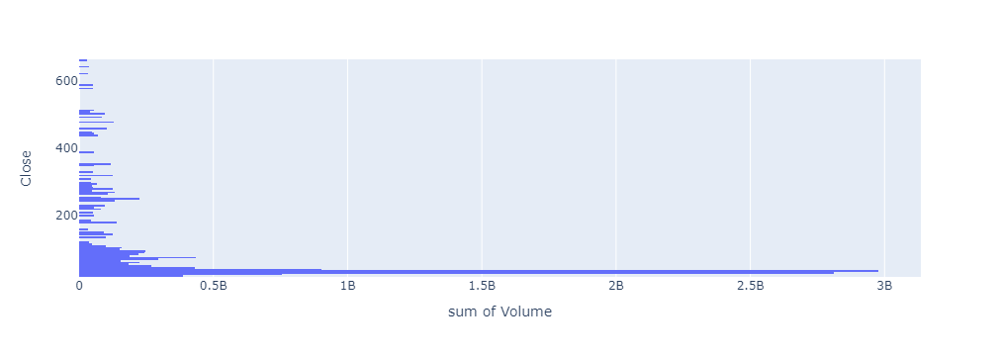

In [207]:
#This is the volume profile in which you get the volume activity at each price.  This highest volume activity at a certain price can make that price
#a good bounce off point
px.histogram(df_stock_mo, x='Volume', y='Close', nbins=150, orientation='h').show()

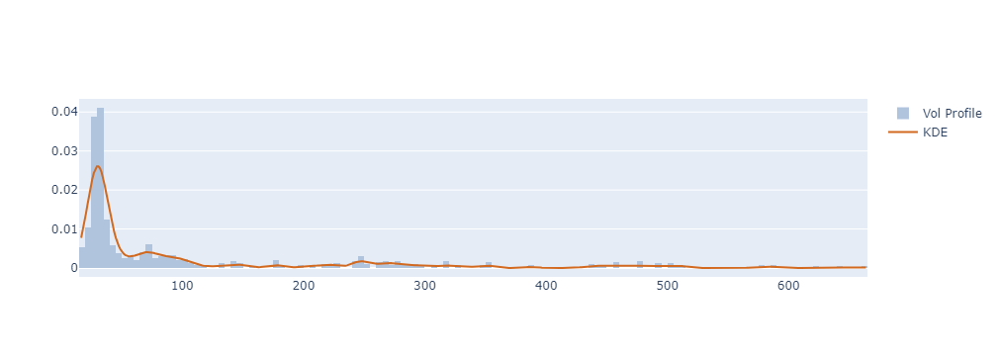

In [208]:
#Vertical volume profile monthly
kde_factor = 0.05
num_samples = 500
close = df_stock_mo['Close']
volume = df_stock_mo['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

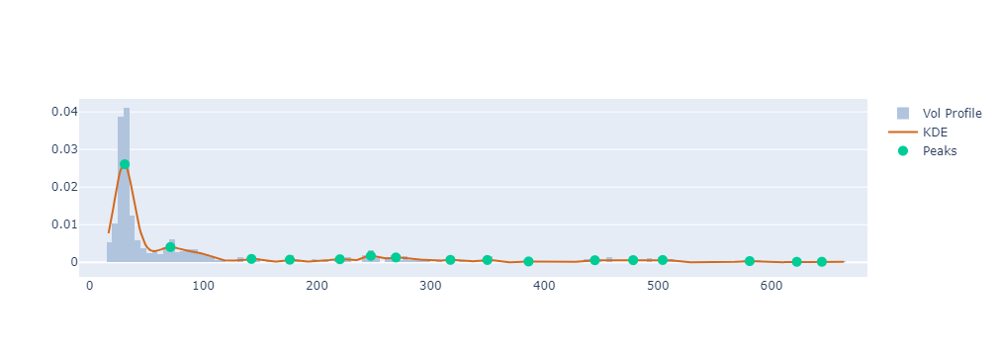

In [209]:
#green dot added monthly
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

In [210]:
#Dashboard functions
#calls the graphs we want to put in
import panel as pn
from panel.interact import interact
import mplfinance as mpf
%matplotlib widget

pn.extension()

def daily_figure():
# add 2 subplots: 1. bars, 2. crosses
    %matplotlib widget
    apds = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
            mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
            mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
            mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
            mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
            mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
            mpf.make_addplot(df_stock['Moving average'], color = 'black'),
            mpf.make_addplot(df_stock['m_avg_08'], color = 'green'),
            mpf.make_addplot(df_stock['m_avg_34'], color = 'orange'),
            mpf.make_addplot(df_stock[['adx']], panel=2, color = 'purple', secondary_y=False),
            mpf.make_addplot(df_stock[['plus_di']], panel=2, color = 'green', secondary_y=False),
            mpf.make_addplot(df_stock[['minus_di']], panel=2, color = 'orange', secondary_y=False),
            mpf.make_addplot(df_stock['m_avg_08'], panel=3, color='red', secondary_y=False),
            mpf.make_addplot(df_stock['m_avg_21'], panel=3, color='orange', secondary_y=False),
            mpf.make_addplot(df_stock['m_avg_34'], panel=3, color='yellow', secondary_y=False),
            mpf.make_addplot(df_stock['m_avg_55'], panel=3, color='green', secondary_y=False),
            mpf.make_addplot(df_stock['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
    fig, axes = mpf.plot(df_stock, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              returnfig=True)
    
    return pn.pane.Matplotlib(fig, tight=True)

def daily_figure_2():
    %matplotlib widget
    apds2 = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
             mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
             mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
             mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
             mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
             mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
             mpf.make_addplot(df_stock['Moving average'], color = 'black'),
             mpf.make_addplot(df_stock['m_avg_08'], color = 'green'),
             mpf.make_addplot(df_stock['m_avg_34'], color = 'orange'),
             mpf.make_addplot(df_stock['slow_K'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock['fast_K'], panel=2, color = 'blue'),
             mpf.make_addplot(df_stock['Overbought'], panel=2, color = 'green'),
             mpf.make_addplot(df_stock['Oversold'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock['Overbought'], panel=3, color = 'green'),
             mpf.make_addplot(df_stock['Oversold'], panel=3, color = 'red'),
             mpf.make_addplot(df_stock['rsi_14'], panel=3, color='purple')]

    fig, axes = mpf.plot(df_stock, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

def weekly_figure(): 
    %matplotlib widget
# add 2 subplots: 1. bars, 2. crosses
    apds = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
            mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
            mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
            mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
            mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
            mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
            mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
            mpf.make_addplot(df_stock_wk['m_avg_08'], color='green'),
            mpf.make_addplot(df_stock_wk['m_avg_34'], color='orange'),
            mpf.make_addplot(df_stock_wk[['adx']], panel=2, color = 'purple', secondary_y=False),
            mpf.make_addplot(df_stock_wk[['plus_di']], panel=2, color = 'green', secondary_y=False),
            mpf.make_addplot(df_stock_wk[['minus_di']], panel=2, color = 'orange', secondary_y=False),
            mpf.make_addplot(df_stock_wk['m_avg_08'], panel=3, color='red', secondary_y=False),
            mpf.make_addplot(df_stock_wk['m_avg_21'], panel=3, color='orange', secondary_y=False),
            mpf.make_addplot(df_stock_wk['m_avg_34'], panel=3, color='yellow', secondary_y=False),
            mpf.make_addplot(df_stock_wk['m_avg_55'], panel=3, color='green', secondary_y=False),
            mpf.make_addplot(df_stock_wk['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
    fig, axes = mpf.plot(df_stock_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

def weekly_figure_2():
    %matplotlib widget
    apds2 = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
             mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
             mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
             mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
             mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
             mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
             mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
             mpf.make_addplot(df_stock_wk['m_avg_08'], color = 'green'),
             mpf.make_addplot(df_stock_wk['m_avg_34'], color = 'orange'),
             mpf.make_addplot(df_stock_wk['slow_K'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock_wk['fast_K'], panel=2, color = 'blue'),
             mpf.make_addplot(df_stock_wk['Overbought'], panel=2, color = 'green'),
             mpf.make_addplot(df_stock_wk['Oversold'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock_wk['Overbought'], panel=3, color = 'green'),
             mpf.make_addplot(df_stock_wk['Oversold'], panel=3, color = 'red'),
             mpf.make_addplot(df_stock_wk['rsi_14'], panel=3, color='purple')]

    fig, axes = mpf.plot(df_stock_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

def monthly_figure(): 
    %matplotlib widget
# add 2 subplots: 1. bars, 2. crosses
    apds = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
            mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
            mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
            mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
            mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
            mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
            mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
            mpf.make_addplot(df_stock_mo['m_avg_08'], color='green'),
            mpf.make_addplot(df_stock_mo['m_avg_34'], color='orange'),
            mpf.make_addplot(df_stock_mo[['adx']], panel=2, color = 'purple', secondary_y=False),
            mpf.make_addplot(df_stock_mo[['plus_di']], panel=2, color = 'green', secondary_y=False),
            mpf.make_addplot(df_stock_mo[['minus_di']], panel=2, color = 'orange', secondary_y=False),
            mpf.make_addplot(df_stock_mo['m_avg_08'], panel=3, color='red', secondary_y=False),
            mpf.make_addplot(df_stock_mo['m_avg_21'], panel=3, color='orange', secondary_y=False),
            mpf.make_addplot(df_stock_mo['m_avg_34'], panel=3, color='yellow', secondary_y=False),
            mpf.make_addplot(df_stock_mo['m_avg_55'], panel=3, color='green', secondary_y=False),
            mpf.make_addplot(df_stock_mo['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
    fig, axes = mpf.plot(df_stock_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

def monthly_figure_2():
    %matplotlib widget
    apds2 = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
             mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
             mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
             mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
             mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
             mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
             mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
             mpf.make_addplot(df_stock_mo['m_avg_08'], color = 'green'),
             mpf.make_addplot(df_stock_mo['m_avg_34'], color = 'orange'),
             mpf.make_addplot(df_stock_mo['slow_K'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock_mo['fast_K'], panel=2, color = 'blue'),
             mpf.make_addplot(df_stock_mo['Overbought'], panel=2, color = 'green'),
             mpf.make_addplot(df_stock_mo['Oversold'], panel=2, color = 'red'),
             mpf.make_addplot(df_stock_mo['Overbought'], panel=3, color = 'green'),
             mpf.make_addplot(df_stock_mo['Oversold'], panel=3, color = 'red'),
             mpf.make_addplot(df_stock_mo['rsi_14'], panel=3, color='purple')]

    fig, axes = mpf.plot(df_stock_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle',
              style='binance',
              addplot=apds2,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

In [211]:
from yahoo_fin import options
import plotly.graph_objects as go
import pandas as pd

expiry = input('enter expiry date eg 12/17/2021')
def get_option_chain(value):
    option_chain = options.get_options_chain(value)
    calls_chain = options.get_calls(value, expiry)
    return calls_chain

enter expiry date eg 12/17/2021 12/17/2021


In [212]:
get_option_chain(value)

,Contract Name,Last Trade Date,Strike,Last Price,Bid,Ask,Change,% Change,Volume,Open Interest,Implied Volatility
0,ADBE211217C00300000,2021-10-18 2:14AM EDT,300.0,282.95,342.20,345.75,0.00,-,-,3,81.54%
1,ADBE211217C00310000,2021-09-22 10:38AM EDT,310.0,314.76,332.25,335.75,0.00,-,-,1,78.91%
2,ADBE211217C00315000,2021-10-05 9:53AM EDT,315.0,251.25,327.25,330.75,0.00,-,-,3,77.30%
3,ADBE211217C00320000,2021-10-01 10:57AM EDT,320.0,255.10,322.25,325.85,0.00,-,3,3,76.86%
4,ADBE211217C00325000,2021-09-27 12:10PM EDT,325.0,282.62,317.30,320.80,0.00,-,-,1,75.27%
5,ADBE211217C00340000,2021-09-30 10:43AM EDT,340.0,245.95,302.35,305.80,0.00,-,-,3,71.19%
6,ADBE211217C00345000,2021-09-30 10:43AM EDT,345.0,241.05,297.50,300.85,0.00,-,-,3,71.44%
7,ADBE211217C00370000,2021-09-08 9:36AM EDT,370.0,291.04,207.30,209.65,0.00,-,-,2,0.00%
8,ADBE211217C00375000,2021-10-18 2:14AM EDT,375.0,233.53,267.95,270.40,0.00,-,-,3,62.74%
9,ADBE211217C00380000,2021-10-18 2:14AM EDT,380.0,227.92,262.55,266.00,0.00,-,-,17,62.72%


In [213]:
import datetime
today_date = datetime.date.today()
today_date = str(today_date)
today_date

'2021-10-23'

In [214]:
def list_of_expiry_dates(value):
    exp_dates = options.get_expiration_dates(value)
    #days = exp_dates - today_date
    return exp_dates

In [180]:
calls_chain = options.get_calls(value, expiry)
calls_chain

,Contract Name,Last Trade Date,Strike,Last Price,Bid,Ask,Change,% Change,Volume,Open Interest,Implied Volatility
0,MA211217C00170000,2021-09-27 10:08AM EDT,170.0,191.35,184.25,186.95,0.00,-,-,10,92.29%
1,MA211217C00175000,2021-09-27 9:45AM EDT,175.0,183.55,179.30,182.60,0.00,-,-,5,99.07%
2,MA211217C00180000,2021-09-20 3:58PM EDT,180.0,161.05,174.30,177.40,0.00,-,1,1,92.94%
3,MA211217C00200000,2021-10-01 11:25AM EDT,200.0,151.60,154.60,156.95,0.00,-,1,11,73.88%
4,MA211217C00205000,2021-09-27 10:15AM EDT,205.0,158.10,149.45,152.95,0.00,-,-,3,82.96%
5,MA211217C00210000,2021-08-25 5:23PM EDT,210.0,167.00,139.60,142.15,0.00,-,-,0,0.00%
6,MA211217C00240000,2021-09-09 11:21AM EDT,240.0,114.05,114.15,117.50,0.00,-,-,1,58.73%
7,MA211217C00250000,2021-09-09 11:21AM EDT,250.0,104.01,105.10,107.65,0.00,-,3,6,54.80%
8,MA211217C00260000,2021-08-27 2:52PM EDT,260.0,97.45,90.40,93.65,0.00,-,4,0,0.00%
9,MA211217C00265000,2021-10-05 1:15PM EDT,265.0,80.98,90.80,92.75,0.00,-,-,3,47.94%


In [222]:
# Create a Title for the Dashboard
#Dashboard setup with the warnings and the graphs
%matplotlib widget
title = "Stock Trading Dashboard"
welcome_tab = pn.Row(pn.Column(title, "Monthly Warnings", momentum_checker_mo(-1), ADX_trend_flag_mo(-1), warning_mo(-1), squeeze_flag_mo(-1), squeeze_momentum_mo(-1)), 
                     pn.Column("Weekly Warnings", momentum_checker_wk(-1), ADX_trend_flag_wk(-1), warning_wk(-1), squeeze_flag_wk(-1), squeeze_momentum_wk(-1)),
                     pn.Column("Daily Warnings",momentum_checker(-1), ADX_trend_flag(-1), warning(-1), squeeze_flag(-1), squeeze_momentum(-1)),
                     pn.Column("Hourly Warnings",momentum_checker_hr(-1), ADX_trend_flag_hr(-1), warning_hr(-1), squeeze_flag_hr(-1), squeeze_momentum_hr(-1)))

monthly_analysis_tab = pn.Column(monthly_figure(), monthly_figure_2())

# Create a tab layout for the dashboard
weekly_analysis_tab = pn.Column(weekly_figure(), weekly_figure_2())

daily_analysis_tab = pn.Column(daily_figure(), daily_figure_2())

option_chain_tab = pn.Row(get_option_chain(value), list_of_expiry_dates(value))

# Create the dashboard
SF_dashboard = pn.Tabs(("Welcome", welcome_tab), 
("Monthly Market Analysis", monthly_analysis_tab),
("Weekly Market Analysis", weekly_analysis_tab), 
("Daily Market Analysis", daily_analysis_tab),
("Option Chain", option_chain_tab))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Tabs
    [0] Row
        [0] Column
            [0] Markdown(str)
            [1] Markdown(str)
            [2] Markdown(str)
            [3] Markdown(str)
            [4] Markdown(str)
            [5] Markdown(str)
            [6] Markdown(str)
        [1] Column
            [0] Markdown(str)
            [1] Markdown(str)
            [2] Markdown(str)
            [3] Markdown(str)
            [4] Markdown(str)
            [5] Markdown(str)
        [2] Column
            [0] Markdown(str)
            [1] Markdown(str)
            [2] Markdown(str)
            [3] Markdown(str)
            [4] Markdown(str)
            [5] Markdown(str)
        [3] Column
            [0] Markdown(str)
            [1] Markdown(str)
            [2] Markdown(str)
            [3] Markdown(str)
            [4] Markdown(str)
            [5] Markdown(str)
    [1] Column
        [0] Matplotlib(Figure, tight=True)
        [1] Matplotlib(Figure, tight=True)
    [2] Column
        [0] Matplotlib(Figure, tight=True)
        [1] Matplotlib(Figure, tight=True)
    [3] Column
        [0] Matplotlib(Figure, tight=True)
        [1] Matplotlib(Figure, tight=True)
    [4] Row
        [0] DataFrame(DataFrame)
        [1] JSON(list)
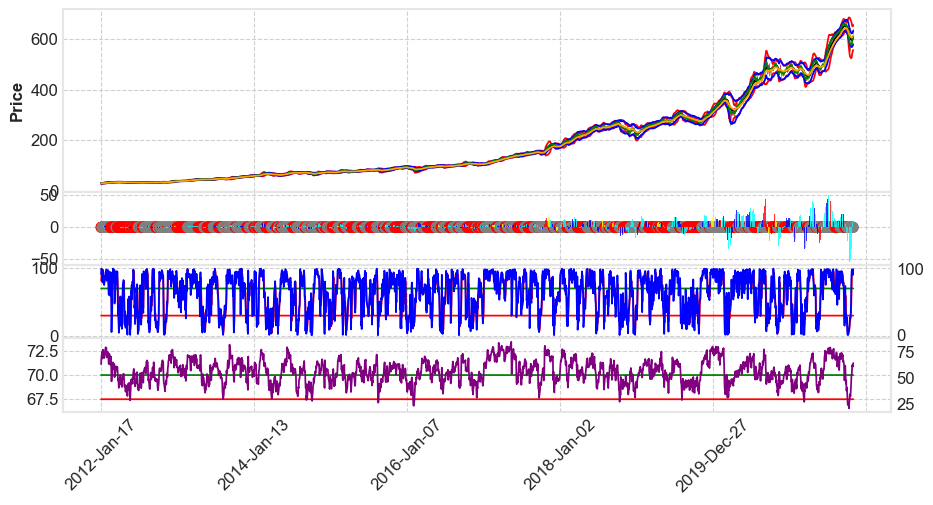
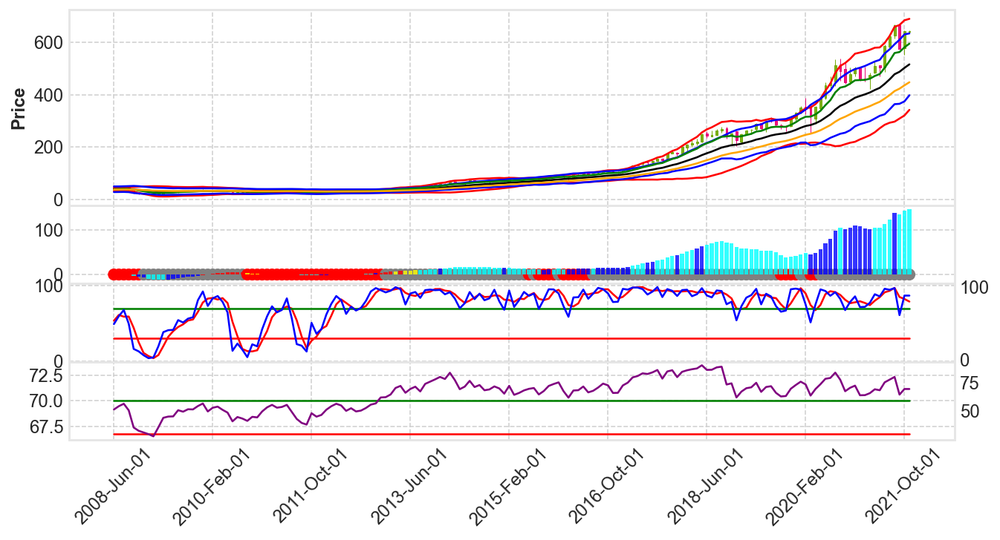
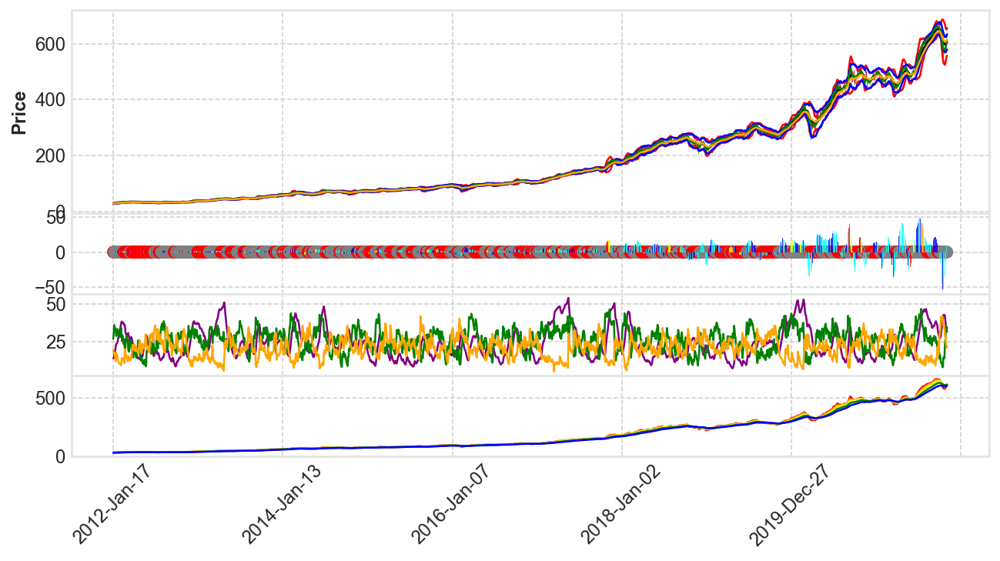
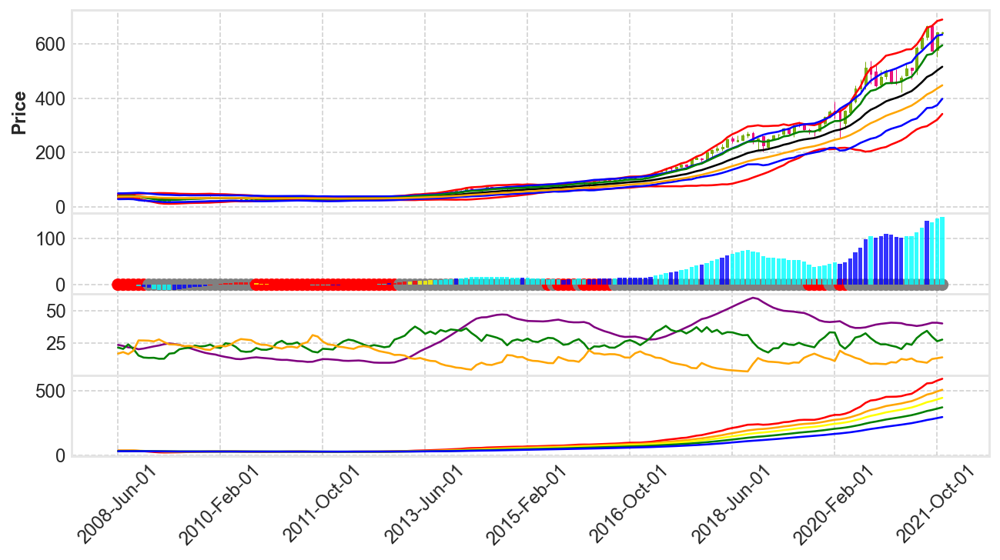
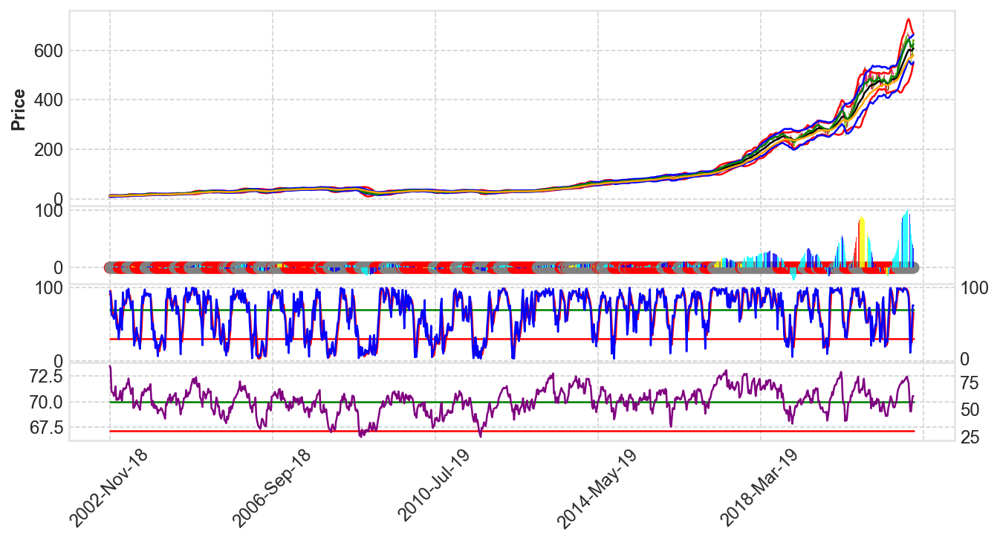
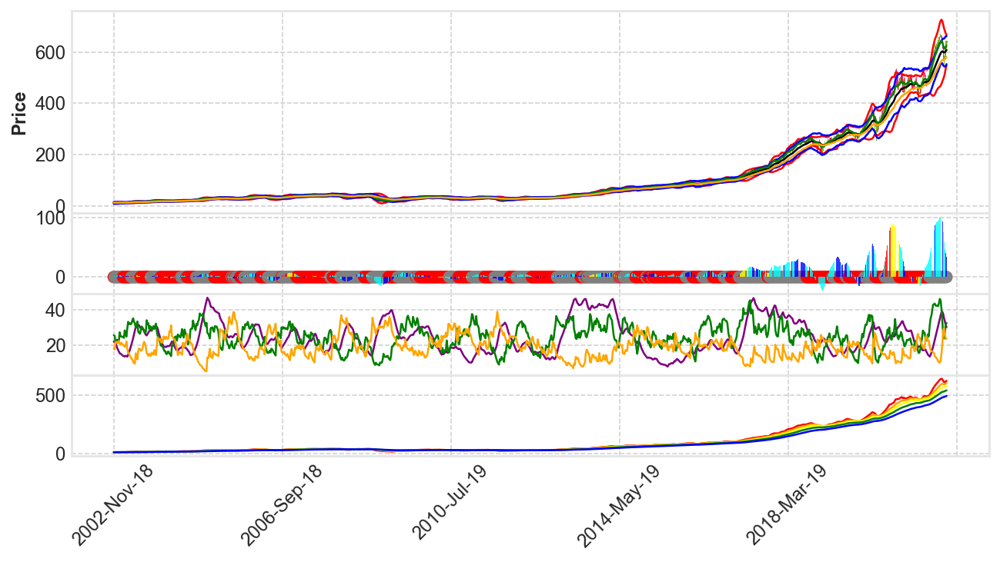

In [223]:
SF_dashboard.servable()